multivariate times series
regular times series
var model et non arima
verifier si stationnary
use referencing if not





In [462]:
#importing the libraries
import numpy as np
import math
import pandas as pd
from datetime import datetime, timedelta, time
from vacances_scolaires_france import SchoolHolidayDates
import sys
from impyute.imputation.cs import mice
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import grangercausalitytests
from pandas.plotting import autocorrelation_plot

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [12.0, 8.0]
import seaborn as sns
#pip install vacances-scolaires-france
#pip3 install impyute
# my fonctions
def conv(data):
    data["date"] = data.timestamp.apply(lambda x : x.split('T')[0])
    data["datetime_perso"] = data.timestamp.apply(lambda x : get_format_the_date(x))
    data['year']=data['datetime_perso'].dt.year
    data['month']=data['datetime_perso'].dt.month
    data['timestamp'] = pd.to_datetime(data['timestamp'])
    data['hours'] = data['timestamp'].dt.hour
    return data

## get season
def get_season(doy):
    spring = range(80, 172)
    summer = range(172, 264)
    fall = range(264, 355)
    if doy in spring:
        season = 'spring'
    elif doy in summer:
      season = 'summer'
    elif doy in fall:
        season = 'fall'
    else:
        season = 'winter'
    return season

## verifie si jour ferie
def easter_date(year):
    a = year // 100
    b = year % 100
    c = (3 * (a + 25)) // 4
    d = (3 * (a + 25)) % 4
    e = (8 * (a + 11)) // 25
    f = (5 * a + b) % 19
    g = (19 * f + c - e) % 30
    h = (f + 11 * g) // 319
    j = (60 * (5 - d) + b) // 4
    k = (60 * (5 - d) + b) % 4
    m = (2 * j - k - g + h) % 7
    n = (g - h + m + 114) // 31
    p = (g - h + m + 114) % 31
    day = p + 1
    month = n
    return datetime(year, month, day)

def is_ferie(the_date):
    year = the_date.year
    easter = easter_date(year)
    days = [
        datetime(year, 1, 1),  # Premier de l'an
        easter + timedelta(days=1),  # Lundi de Pâques
        datetime(year, 5, 1),  # Fête du Travail
        datetime(year, 5, 8),  # Victoire de 1945
        easter + timedelta(days=39),  # Ascension
        easter + timedelta(days=49),  # Pentecôte
        datetime(year, 7, 14),  # Fête Nationale
        datetime(year, 8, 15),  # Assomption
        datetime(year, 11, 1),  # Toussaint
        datetime(year, 11, 11),  # Armistice 1918
        datetime(year, 12, 25),  # Noël
    ]
    return the_date in days

def get_format_the_date(timestamp):
    do = datetime.strptime(timestamp, '%Y-%m-%dT%H:%M:%S.%f')
    d5 = do.replace(minute=0, hour=0, second=0, microsecond=0).isoformat(' ')
    the_date = datetime.strptime(d5, "%Y-%m-%d %H:%M:%S")
    return the_date

def business_day(timestamp):
    if not is_ferie(timestamp) and timestamp.isoweekday() not in [6, 7]:
        return True
    else:
        return False
    
  

In [463]:
#Summary Statistics
def check_summary(series):
    """
    Split the series into two and check summary statistics for both the series
    """
    
    X = series.values
    split =int( len(X) / 2)
    X1, X2 = X[0:split], X[split:]
    meanoverall, mean1, mean2 = X.mean(), X1.mean(), X2.mean()
    varoverall, var1, var2 = X.var(), X1.var(), X2.var()
    print('mean overall = %f, \t mean1=%f, \t mean2=%f' % (meanoverall, mean1, mean2))
    print('variance overall= %f, \t variance1=%f, \t variance2=%f' % (varoverall, var1, var2))


#Distribution by plotting Histogram
def check_distribution(series):
    """
    Distribution by plotting Histogram
    """
    series.hist()
    plt.show()        


#Stationarity Check:
def check_stationarity(series):   
    """
    Check stationarity using ADF test
    Ho : The series is non-stationary and has a unit root --> p-value > 0.05
    H1 : The series is stationary and does not have a unit root --> p-value < 0.05
    """
   
    X = series.values
    result = adfuller(X)
    print('Test: Running ADF Stationarity test for {} \n\t ADF test statistic: {} \n\t p-value: {} '.format(series.name, result[0], result[1]))

    print('\n\tCritical Values:')
    for key, value in result[4].items():
    	print('\t%s: %.3f' % (key, value))
    
    if result[4]['5%'] > result[0]:
        conclusion = 'Series is Stationary @95% CI'
        print ('\t Conclusion: Series is stationary at 95% CI\n')
    elif result[4]['10%'] > result[0]:
        conclusion = 'Series is Stationary @90% CI'
        print ('\t Conclusion: Series is stationary at 90% CI but non-stationary at 95% CI\n')
    else:
        conclusion = 'Series is non-Stationary'
        print ('\t Conclusion: Series is non-stationary\n')
    return conclusion
        
#Series Plots:
def check_plots(series):
    """
    Plots the series as a line chart
    """
    plt.plot(series)
    plt.show()        
    
def check_normality(series):
    result = stats.normaltest(series)
    
    print('Test: Running Agostino and Pearson Normality test for {} \n\t Normality test statistic: {} \n\t p-value: {} '.format(series.name, result[0], result[1]))
    
    if(result[1]< 0.05):
        conclusion = 'Not Normally Distributed'
        print('\t Conclusion: {} is not normally distributed at 95% CI \n'.format(series.name))
    else:
        conclusion = 'Normally Distributed'
        print('\t Conclusion: {} is normally distributed at 95% CI \n'.format(series.name))
        
    return conclusion 

In [464]:
def processing(dataInt):
    ## missing value
    df = dataInt.copy()
    #df_num = df.drop(['timestamp','loc_1', 'loc_2', 'loc_secondary_1', 'loc_secondary_2', 'loc_secondary_3'], axis=1)
    #df_NonNum = df.select_dtypes(include=[np.object])
    imputed_training_mice = mice(df.values)
    data_mice = pd.DataFrame(imputed_training_mice, columns = df.columns, index = list(df.index.values))
   # dClean = data_mice.join(df_NonNum)
    ## drop variable inutile
    #d_tr = dClean.drop(['loc_1', 'loc_2', 'loc_secondary_1', 'loc_secondary_2', 'loc_secondary_3'], axis=1)
    ## create extra attribute
    #conv(d_tr)
    #d_tr['timestamp'] = pd.to_datetime(d_tr.timestamp, format = '%Y-%m-%dT%H:%M:%S.%f')
    ## create season and rangeInYear
    #s = pd.to_datetime(pd.Series(d_tr['timestamp']))
    #d_tr['rangeInYear'] = s.dt.strftime('%j').astype(int)
    #create jours working days
   # d_tr['is_business_day'] = d_tr['datetime_perso'].apply(lambda e : int(business_day(e)))
    #Is it an holiday for zone A, B or C?
    #d = SchoolHolidayDates()
    #d_tr['is_holiday'] = d_tr['datetime_perso'].apply(lambda f : int(d.is_holiday(datetime.date(f))))
    #d_tr['season'] = d_tr['rangeInYear'].apply(lambda d : get_season(d))
    #dataInt1 = d_tr.drop(['rangeInYear', 'datetime_perso', 'date', 'timestamp'], axis=1)
    return (data_mice)  


--------------------------------------------------------------------------------------------------------------------

In [465]:
# creere un je
dataInt_raw = pd.read_csv('./data_set1/input_training_ssnsrY0.csv')
dataOut_raw = pd.read_csv('./data_set1/output_training_Uf11I9I.csv')
data_raw = pd.concat([dataInt_raw, dataOut_raw], axis=1)
data_raw.head()
data_raw.columns
#----------------------


Index(['ID', 'timestamp', 'temp_1', 'temp_2', 'mean_national_temp',
       'humidity_1', 'humidity_2', 'loc_1', 'loc_2', 'loc_secondary_1',
       'loc_secondary_2', 'loc_secondary_3', 'consumption_secondary_1',
       'consumption_secondary_2', 'consumption_secondary_3', 'ID',
       'consumption_1', 'consumption_2'],
      dtype='object')

In [466]:
data_raw.head(2)

,ID,timestamp,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,loc_1,loc_2,loc_secondary_1,loc_secondary_2,loc_secondary_3,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,ID,consumption_1,consumption_2
0,0,2016-11-01T00:00:00.0,8.3,NaN,11.1,95.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",143,74,168,0,100,93
1,1,2016-11-01T01:00:00.0,8.0,NaN,11.1,98.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",141,60,162,1,101,94


In [467]:
data_raw.describe()

,ID,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,ID,consumption_1,consumption_2
count,8760.000000,8589.000000,8429.000000,8760.000000,8589.000000,8428.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,4379.500000,11.402771,15.086274,13.173858,77.351496,63.443284,203.025114,123.581735,235.774201,4379.500000,137.549543,148.529909
std,2528.938512,7.049919,8.463627,6.474700,16.638173,21.900343,69.792811,65.036526,99.701896,2528.938512,63.146689,73.263972
min,0.000000,-5.700000,-7.200000,-1.800000,21.000000,12.000000,84.000000,0.000000,94.000000,0.000000,38.000000,0.000000
25%,2189.750000,6.100000,9.000000,8.200000,66.000000,46.000000,150.000000,73.000000,166.000000,2189.750000,91.000000,105.000000
50%,4379.500000,11.200000,14.500000,12.800000,81.000000,65.000000,181.000000,107.000000,194.000000,4379.500000,116.000000,129.000000
75%,6569.250000,16.400000,21.000000,18.700000,91.000000,83.000000,252.000000,160.000000,287.250000,6569.250000,176.000000,181.000000
max,8759.000000,33.600000,39.300000,28.300000,100.000000,99.000000,464.000000,355.000000,570.000000,8759.000000,349.000000,542.000000


In [468]:
data_raw['timestamp'] = pd.to_datetime(data_raw['timestamp'])

In [469]:
data_raw.set_index('timestamp', inplace=True)

In [470]:
data_raw.head()

,ID,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,loc_1,loc_2,loc_secondary_1,loc_secondary_2,loc_secondary_3,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,ID,consumption_1,consumption_2
timestamp,,,,,,,,,,,,,,,,,
2016-11-01 00:00:00,0,8.3,NaN,11.1,95.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",143,74,168,0,100,93
2016-11-01 01:00:00,1,8.0,NaN,11.1,98.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",141,60,162,1,101,94
2016-11-01 02:00:00,2,6.8,NaN,11.0,97.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",142,60,164,2,100,96
2016-11-01 03:00:00,3,7.5,NaN,10.9,99.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",139,60,162,3,101,95
2016-11-01 04:00:00,4,6.1,NaN,10.8,98.0,NaN,"(50.633, 3.067)","(43.530, 5.447)","(44.838, -0.579)","(47.478, -0.563)","(48.867, 2.333)",154,60,164,4,100,100


In [471]:
data_raw.shape


(8760, 17)

In [472]:
df = data_raw.loc[:, ['temp_1', 'temp_2','mean_national_temp', 'humidity_1', 'humidity_2', 
                              'consumption_secondary_1', 'consumption_secondary_2', 'consumption_secondary_3','consumption_1','consumption_2']]


In [473]:
df.shape

(8760, 10)

In [474]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Import Statsmodels
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

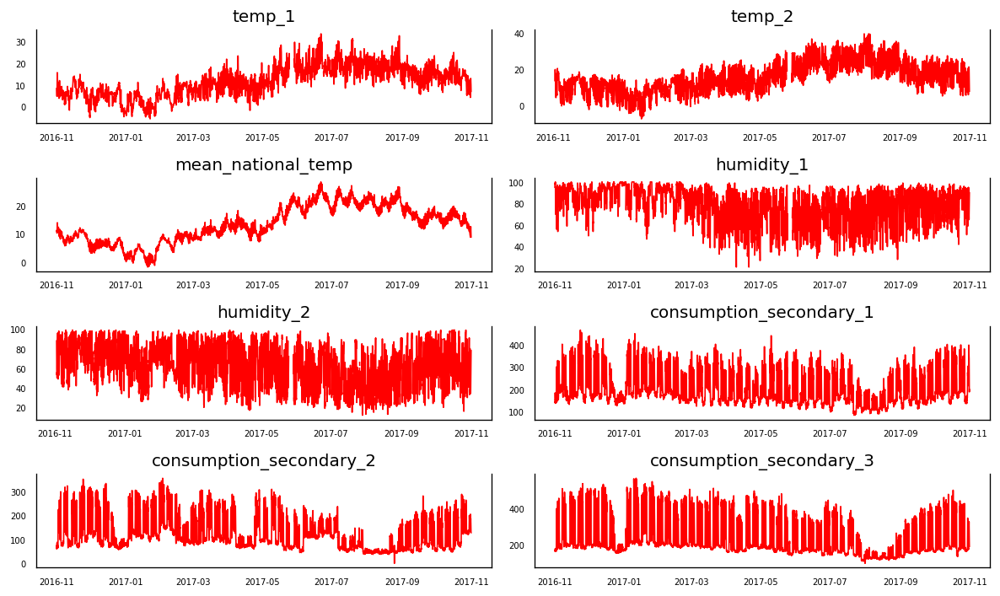

In [475]:
# Plot
fig, axes = plt.subplots(nrows=4, ncols=2, dpi=120, figsize=(10,6))
for i, ax in enumerate(axes.flatten()):
    data = df[df.columns[i]]
    ax.plot(data, color='red', linewidth=1)
    # Decorations
    ax.set_title(df.columns[i])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

In [476]:
df1 = processing(df) #si activation remettre les df1 de dessus en df

In [477]:
df1.index = pd.to_datetime(df.index)
df1.index

DatetimeIndex(['2016-11-01 00:00:00', '2016-11-01 01:00:00',
               '2016-11-01 02:00:00', '2016-11-01 03:00:00',
               '2016-11-01 04:00:00', '2016-11-01 05:00:00',
               '2016-11-01 06:00:00', '2016-11-01 07:00:00',
               '2016-11-01 08:00:00', '2016-11-01 09:00:00',
               ...
               '2017-10-31 14:00:00', '2017-10-31 15:00:00',
               '2017-10-31 16:00:00', '2017-10-31 17:00:00',
               '2017-10-31 18:00:00', '2017-10-31 19:00:00',
               '2017-10-31 20:00:00', '2017-10-31 21:00:00',
               '2017-10-31 22:00:00', '2017-10-31 23:00:00'],
              dtype='datetime64[ns]', name='timestamp', length=8760, freq=None)

In [478]:
df1.shape

(8760, 10)

In [479]:
df1.head(2)

,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
timestamp,,,,,,,,,,
2016-11-01 00:00:00,8.3,11.103866,11.1,95.0,75.596539,143.0,74.0,168.0,100.0,93.0
2016-11-01 01:00:00,8.0,10.712606,11.1,98.0,77.146111,141.0,60.0,162.0,101.0,94.0


In [480]:
df2 = df1.copy()

In [481]:
df2 = df2.resample('D').mean()

In [482]:
df1.shape


(8760, 10)

In [483]:
df2.shape

(365, 10)

In [484]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 365 entries, 2016-11-01 to 2017-10-31
Freq: D
Data columns (total 10 columns):
temp_1                     365 non-null float64
temp_2                     365 non-null float64
mean_national_temp         365 non-null float64
humidity_1                 365 non-null float64
humidity_2                 365 non-null float64
consumption_secondary_1    365 non-null float64
consumption_secondary_2    365 non-null float64
consumption_secondary_3    365 non-null float64
consumption_1              365 non-null float64
consumption_2              365 non-null float64
dtypes: float64(10)
memory usage: 31.4 KB


In [485]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=2
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df


In [486]:

grangers_causation_matrix(df2, variables = df2.columns)    

,temp_1_x,temp_2_x,mean_national_temp_x,humidity_1_x,humidity_2_x,consumption_secondary_1_x,consumption_secondary_2_x,consumption_secondary_3_x,consumption_1_x,consumption_2_x
temp_1_y,1.0000,0.0000,0.0,0.0904,0.0000,0.0255,0.1591,0.0169,0.0394,0.0096
temp_2_y,0.0000,1.0000,0.0,0.0027,0.0368,0.5597,0.8918,0.7670,0.4353,0.7851
mean_national_temp_y,0.0000,0.0018,1.0,0.0256,0.0004,0.0017,0.1298,0.0054,0.0180,0.0110
humidity_1_y,0.0000,0.0000,0.0,1.0000,0.0006,0.1257,0.1830,0.2040,0.0108,0.0274
humidity_2_y,0.0001,0.0000,0.0,0.0001,1.0000,0.0142,0.0023,0.0009,0.0000,0.0008
consumption_secondary_1_y,0.0000,0.0000,0.0,0.0001,0.0004,1.0000,0.0077,0.2560,0.0001,0.0000
consumption_secondary_2_y,0.0000,0.0000,0.0,0.0016,0.0001,0.0000,1.0000,0.0006,0.0415,0.0000
consumption_secondary_3_y,0.0000,0.0000,0.0,0.0001,0.0001,0.0001,0.0622,1.0000,0.0287,0.0000
consumption_1_y,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0202,0.0000,1.0000,0.0000
consumption_2_y,0.0000,0.0000,0.0,0.0036,0.1151,0.0000,0.0000,0.0000,0.0000,1.0000


In [487]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen

In [488]:
def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

cointegration_test(df1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
temp_1 ::  3943.64   > 219.4051  =>   True
temp_2 ::  2247.19   > 179.5199  =>   True
mean_national_temp ::  1619.64   > 143.6691  =>   True
humidity_1 ::  1214.78   > 111.7797  =>   True
humidity_2 ::  846.54    > 83.9383   =>   True
consumption_secondary_1 ::  520.05    > 60.0627   =>   True
consumption_secondary_2 ::  306.88    > 40.1749   =>   True
consumption_secondary_3 ::  149.44    > 24.2761   =>   True
consumption_1 ::  12.01     > 12.3212   =>   False
consumption_2 ::  0.55      > 4.1296    =>   False


In [489]:
#split
nobs = 292
df1_train, df1_test = df1[0:-nobs], df1[-nobs:]

# Check size
print(df1_train.shape)  # (8468, 8)()
print(df1_test.shape)  # 292, 8)

(8468, 10)
(292, 10)


In [490]:
df1_train.index

DatetimeIndex(['2016-11-01 00:00:00', '2016-11-01 01:00:00',
               '2016-11-01 02:00:00', '2016-11-01 03:00:00',
               '2016-11-01 04:00:00', '2016-11-01 05:00:00',
               '2016-11-01 06:00:00', '2016-11-01 07:00:00',
               '2016-11-01 08:00:00', '2016-11-01 09:00:00',
               ...
               '2017-10-19 11:00:00', '2017-10-19 12:00:00',
               '2017-10-19 13:00:00', '2017-10-19 14:00:00',
               '2017-10-19 15:00:00', '2017-10-19 16:00:00',
               '2017-10-19 17:00:00', '2017-10-19 18:00:00',
               '2017-10-19 19:00:00', '2017-10-19 20:00:00'],
              dtype='datetime64[ns]', name='timestamp', length=8468, freq=None)

In [491]:
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':r[0], 'pvalue':r[1],  'n_lags':r[2], 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 5)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")   
          
         

In [492]:
# ADF Test on each column
for name, column in df1_train.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "temp_1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.492690204237516
 No. Lags Chosen       = 37
 Critical value 1%     = -3.43113
 Critical value 5%     = -2.86188
 Critical value 10%    = -2.56695
 => P-Value = 0.008176821673880801. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "temp_2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.275626568842441
 No. Lags Chosen       = 33
 Critical value 1%     = -3.43113
 Critical value 5%     = -2.86188
 Critical value 10%    = -2.56695
 => P-Value = 0.016003747957319434. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "mean_national_temp" 
    --------------------------------------------

In [493]:
df1_differenced = df1_train.diff(366).dropna()

In [494]:
# ADF Test on each column of 1st Differences Dataframe
for name, column in df1_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "temp_1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.895525287736442
 No. Lags Chosen       = 37
 Critical value 1%     = -3.43116
 Critical value 5%     = -2.8619
 Critical value 10%    = -2.56696
 => P-Value = 4.321331158986706e-12. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "temp_2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.351505772238129
 No. Lags Chosen       = 33
 Critical value 1%     = -3.43116
 Critical value 5%     = -2.8619
 Critical value 10%    = -2.56696
 => P-Value = 1.0031630058196446e-10. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "mean_national_temp" 
    -------------------------------------------

In [495]:
df1_train.head()

,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
timestamp,,,,,,,,,,
2016-11-01 00:00:00,8.3,11.103866,11.1,95.0,75.596539,143.0,74.0,168.0,100.0,93.0
2016-11-01 01:00:00,8.0,10.712606,11.1,98.0,77.146111,141.0,60.0,162.0,101.0,94.0
2016-11-01 02:00:00,6.8,10.653735,11.0,97.0,76.974281,142.0,60.0,164.0,100.0,96.0
2016-11-01 03:00:00,7.5,10.379518,10.9,99.0,77.932209,139.0,60.0,162.0,101.0,95.0
2016-11-01 04:00:00,6.1,10.251482,10.8,98.0,78.055195,154.0,60.0,164.0,100.0,100.0


In [496]:
df1_differenced.head()

,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
timestamp,,,,,,,,,,
2016-11-16 06:00:00,4.8,-9.803866,-2.7,0.0,21.403461,90.0,79.0,58.0,64.0,76.0
2016-11-16 07:00:00,4.9,-9.612606,-2.8,-3.0,19.853889,124.0,107.0,119.0,120.0,151.0
2016-11-16 08:00:00,5.9,-8.953735,-2.6,-2.0,21.025719,160.0,194.0,182.0,139.0,215.0
2016-11-16 09:00:00,5.0,-4.779518,-2.4,-5.0,21.067791,217.0,226.0,268.0,149.0,224.0
2016-11-16 10:00:00,6.5,-1.051482,-2.0,-6.0,-4.055195,234.0,239.0,305.0,166.0,207.0


In [497]:
model = VAR(df1_differenced)

/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


In [498]:
model.select_order(30)

In [499]:
res= model.fit(maxlags=15, ic='aic')

In [500]:
res.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 14, Jul, 2019
Time:                     19:57:20
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                    31.5006
Nobs:                     8087.00    HQIC:                   30.6409
Log likelihood:          -235329.    FPE:                1.29741e+13
AIC:                      30.1939    Det(Omega_mle):     1.07829e+13
--------------------------------------------------------------------
Results for equation temp_1
                                 coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------------------
const                               0.006560         0.010769            0.609           0.542
L1.temp_1                           1.266247         0.014870           85.154           0.000
L1.

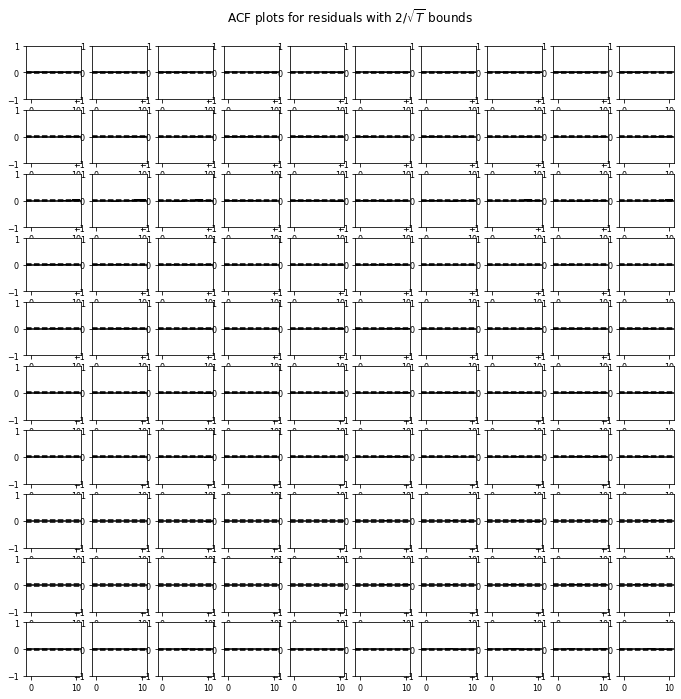

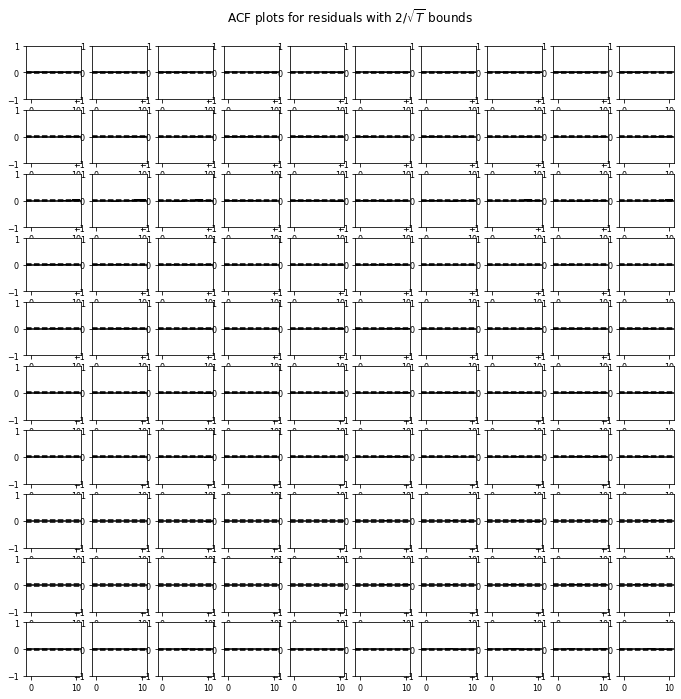

In [501]:
res.plot_acorr()

In [502]:

for i in [1,2,3,4,5,6,7,8,9, 10, 11, 12, 13, 14]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  34.798581348833565
BIC :  34.89362785011506
FPE :  1296677171850297.5
HQIC:  34.8310937694686 

Lag Order = 2
AIC :  32.125966713485155
BIC :  32.3074383260208
FPE :  89563306795476.06
HQIC:  32.18804283175714 

Lag Order = 3
AIC :  31.688659185660818
BIC :  31.95657420253169
FPE :  57837563005567.6
HQIC:  31.780305624536076 

Lag Order = 4
AIC :  31.533215636169782
BIC :  31.887592356669014
FPE :  49511025664838.59
HQIC:  31.65443902092874 

Lag Order = 5
AIC :  31.284901641674555
BIC :  31.725758371310214
FPE :  38624322386703.14
HQIC:  31.435708599912807 

Lag Order = 6
AIC :  31.075777474387596
BIC :  31.603132524885574
FPE :  31335737210526.062
HQIC:  31.25617463601701 

Lag Order = 7
AIC :  30.90756897014951
BIC :  31.521440659456406
FPE :  26484306567546.18
HQIC:  31.11756296739932 

Lag Order = 8
AIC :  30.730789707827093
BIC :  31.43119636011311
FPE :  22192963380757.316
HQIC:  30.970387175244998 

Lag Order = 9
AIC :  30.6732028682758
BIC :  31.4601628139

In [ ]:
x = model.select_order(maxlags=37)
x.summary()

In [ ]:
model_fitted = model.fit(28)
model_fitted.summary()

A common way of checking for serial correlation of errors can be measured using the Durbin Watson’s Statistic.

Durbin Watson Statistic - Formula

The value of this statistic can vary between 0 and 4. The closer it is to the value 2, then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, and the closer it is to 4 implies negative serial correlation.

In [ ]:
from statsmodels.stats.stattools import durbin_watson


In [ ]:
out = durbin_watson(model_fitted.resid)

In [ ]:
for col, val in zip(df1.columns, out):
    print(col, ':', round(val, 2))

In [ ]:
# Get the lag order
lag_order = model_fitted.k_ar
print(lag_order)  #> 4

In [ ]:
# Input data for forecasting
forecast_input = df1_differenced.values[-lag_order:]
forecast_input

In [ ]:
# Forecast
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
df_forecast = pd.DataFrame(fc, index=df.index[-nobs:], columns=df.columns + '_1d')
df_forecast

In [ ]:
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc

In [ ]:
df_results = invert_transformation(df1_train, df_forecast, second_diff=False)
df_results.columns

In [ ]:
df_results.loc[:,[ 'temp_1_forecast',
       'temp_2_forecast', 'mean_national_temp_forecast', 'humidity_1_forecast',
       'humidity_2_forecast', 'consumption_secondary_1_forecast',
       'consumption_secondary_2_forecast', 'consumption_secondary_3_forecast',
       'consumption_1_forecast', 'consumption_2_forecast']]

In [ ]:
fig, axes = plt.subplots(nrows=int(len(df1.columns)/2), ncols=2, dpi=150, figsize=(10,10))
for i, (col,ax) in enumerate(zip(df1.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    df1_test[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

In [ ]:
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

print('Forecast Accuracy of: temp_1')
accuracy_prod = forecast_accuracy(df_results['temp_1_forecast'].values, df1_test['temp_1'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: temp_2')
accuracy_prod = forecast_accuracy(df_results['temp_2_forecast'].values, df1_test['temp_2'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: mean_national_temp')
accuracy_prod = forecast_accuracy(df_results['mean_national_temp_forecast'].values, df1_test['mean_national_temp'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))
print('\nForecast Accuracy of: humidity_1')
accuracy_prod = forecast_accuracy(df_results['humidity_1_forecast'].values, df1_test['humidity_1'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: humidity_2')
accuracy_prod = forecast_accuracy(df_results['humidity_2_forecast'].values, df1_test['humidity_2'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: consumption_secondary_1')
accuracy_prod = forecast_accuracy(df_results['consumption_secondary_1_forecast'].values, df1_test['consumption_secondary_1'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: consumption_secondary_2')
accuracy_prod = forecast_accuracy(df_results['consumption_secondary_2_forecast'].values, df1_test['consumption_secondary_2'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: consumption_secondary_3')
accuracy_prod = forecast_accuracy(df_results['consumption_secondary_3_forecast'].values, df1_test['consumption_secondary_3'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: consumption_1')
accuracy_prod = forecast_accuracy(df_results['consumption_1_forecast'].values, df1_test['consumption_1'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

print('\nForecast Accuracy of: consumption_2')
accuracy_prod = forecast_accuracy(df_results['consumption_2_forecast'].values, df1_test['consumption_2'])
for k, v in accuracy_prod.items():
    print((k), ': ', round(v,4))

In [ ]:
def list_and_visualize_missing_data(dataset):
    # Listing total null items and its percent with respect to all nulls
    total = dataset.isnull().sum().sort_values(ascending=False)
    percent = ((dataset.isnull().sum())/(dataset.isnull().count())).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    missing_data = missing_data[missing_data.Total > 0]
    missing_data.plot.bar(subplots=True, figsize=(16,9))
list_and_visualize_missing_data(data)

In [12]:
data1 = processing(data)

In [13]:
data1.columns

Index(['temp_1', 'temp_2', 'mean_national_temp', 'humidity_1', 'humidity_2',
       'consumption_secondary_1', 'consumption_secondary_2',
       'consumption_secondary_3', 'consumption_1', 'consumption_2'],
      dtype='object')

In [14]:
data1.head(2)

,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
2016-11-01 00:00:00,8.3,11.346715,11.1,95.0,73.802244,143.0,74.0,168.0,100.0,93.0
2016-11-01 01:00:00,8.0,10.986511,11.1,98.0,75.122560,141.0,60.0,162.0,101.0,94.0


In [15]:
data1.dtypes

temp_1                     float64
temp_2                     float64
mean_national_temp         float64
humidity_1                 float64
humidity_2                 float64
consumption_secondary_1    float64
consumption_secondary_2    float64
consumption_secondary_3    float64
consumption_1              float64
consumption_2              float64
dtype: object

In [16]:
data1.index.dtype

dtype('<M8[ns]')

In [17]:
data1.index = pd.to_datetime(data.index)
data1.index

DatetimeIndex(['2016-11-01 00:00:00', '2016-11-01 01:00:00',
               '2016-11-01 02:00:00', '2016-11-01 03:00:00',
               '2016-11-01 04:00:00', '2016-11-01 05:00:00',
               '2016-11-01 06:00:00', '2016-11-01 07:00:00',
               '2016-11-01 08:00:00', '2016-11-01 09:00:00',
               ...
               '2017-10-31 14:00:00', '2017-10-31 15:00:00',
               '2017-10-31 16:00:00', '2017-10-31 17:00:00',
               '2017-10-31 18:00:00', '2017-10-31 19:00:00',
               '2017-10-31 20:00:00', '2017-10-31 21:00:00',
               '2017-10-31 22:00:00', '2017-10-31 23:00:00'],
              dtype='datetime64[ns]', name='timestamp', length=8760, freq=None)

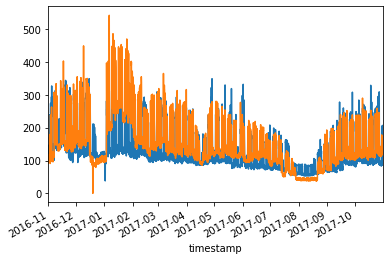

In [18]:
data1['consumption_1'].plot()
data1['consumption_2'].plot()

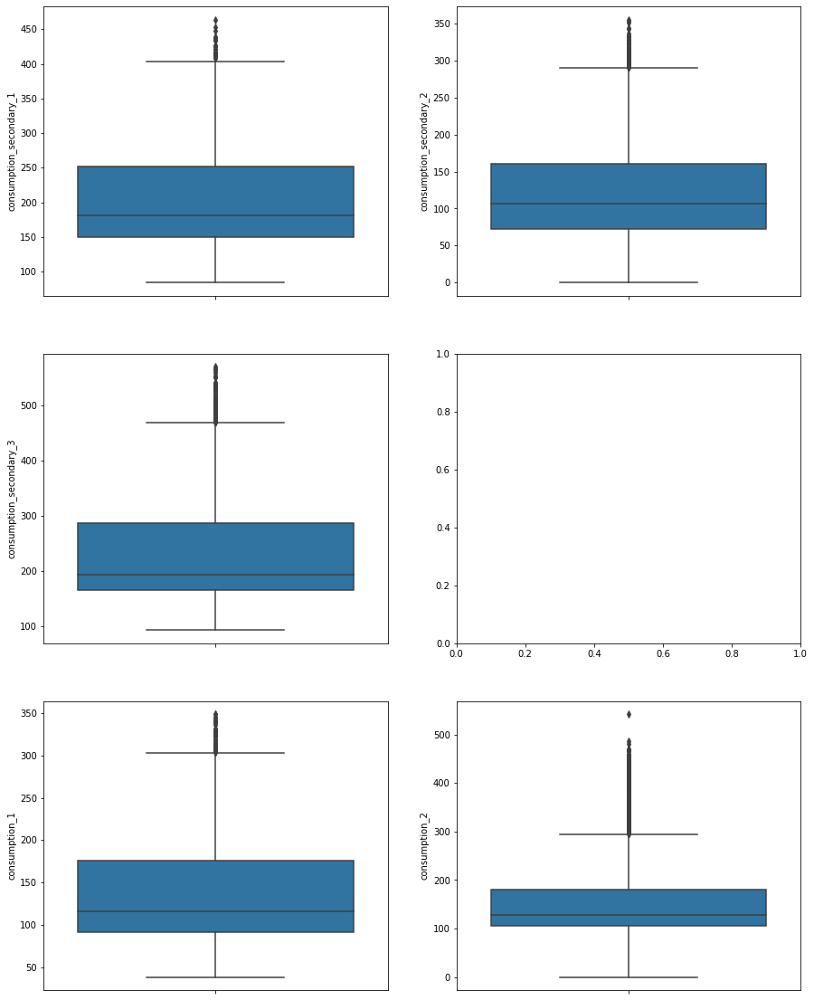

In [19]:
fig, axes = plt.subplots(nrows=3,ncols=2)
fig.set_size_inches(15, 20)
sns.boxplot(data=data1,y="consumption_secondary_1",orient="v",ax=axes[0][0])
sns.boxplot(data=data1,y="consumption_secondary_2",orient="v",ax=axes[0][1])
sns.boxplot(data=data1,y="consumption_secondary_3",orient="v",ax=axes[1][0])
sns.boxplot(data=data1,y="consumption_1",orient="v",ax=axes[2][0])
sns.boxplot(data=data1,y="consumption_2",orient="v",ax=axes[2][1])

In [20]:
cols_plot = data1.columns

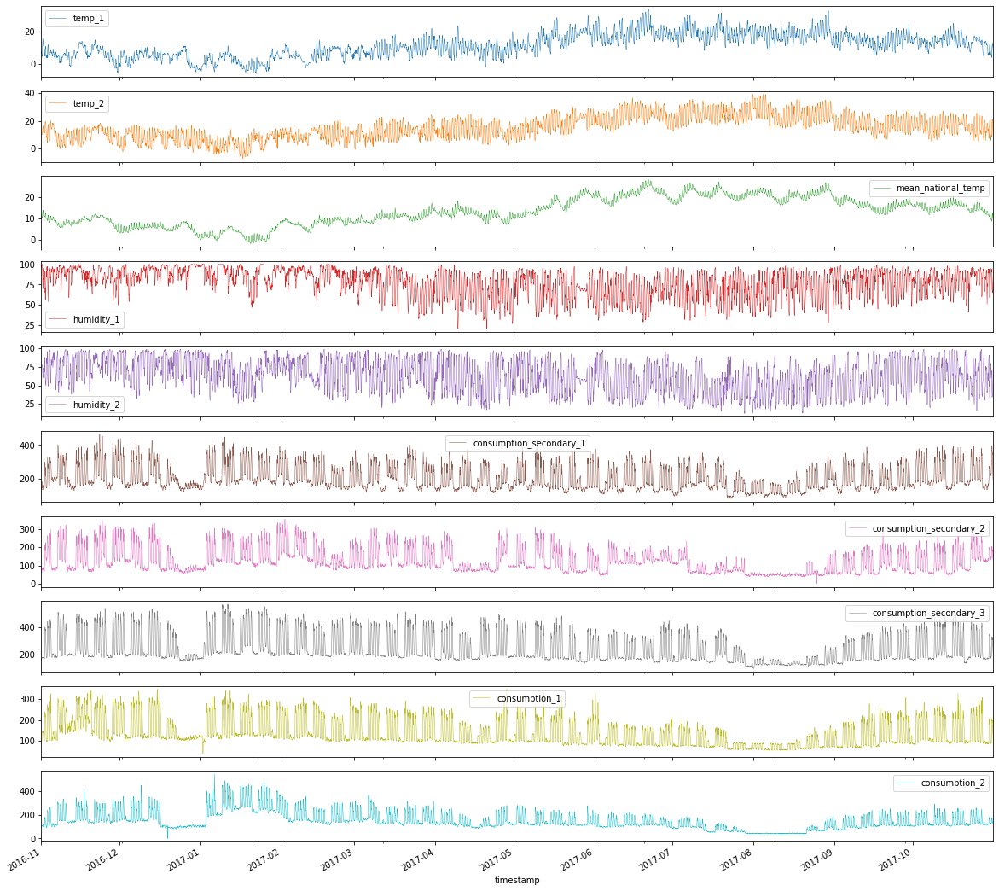

In [21]:
axes = data1[cols_plot].plot(alpha=1., linewidth=.5, figsize=(20, 20), subplots=True, sharex=True)

In [22]:
import plotly
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

In [23]:
groupBy_whole = data1.groupby('timestamp').mean()


trace1 = go.Scatter(
        x=groupBy_whole.temp_1.index, 
        y=groupBy_whole.temp_1, 
        mode = 'lines',
        name = 'temp_1',
        marker = dict(color = 'rgba(0, 191, 205, 0.4)'))
trace2 = go.Scatter(
        x=groupBy_whole.temp_2.index, 
        y=groupBy_whole.temp_2, 
        mode = 'lines',
        name = 'temp_2',
        marker = dict(color = 'rgba(1, 50, 2, 0.2)'))
trace3 = go.Scatter(
        x=groupBy_whole.mean_national_temp.index, 
        y=groupBy_whole.mean_national_temp, 
        mode = 'lines',
        name = 'mean_national_temp',
        marker = dict(color = 'rgba(0, 61, 80, 0.6)'))

data = [trace1, trace2, trace3]

# layout=dict(title="Time Series Plot for Mean Daily temperature", xaxis={'title':'Date'}, yaxis={'title':'Temp/Humidity'})
layout = dict(
    title="Time Series Plot for Mean Daily temperature",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=4,
                     label='4m',
                     step='month',
                     stepmode='backward'),
                dict(count=1,
                    label='YTD',
                    step='year',
                    stepmode='todate'),
                dict(count=1,
                    label='1y',
                    step='year',
                    stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
    yaxis={'title':'Temp/Humidity'}
)
fig=dict(data=data,layout=layout)
iplot(fig)

In [24]:
#define function for ADF test
def adf_test(timeseries):
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

In [25]:
#define KPSS
def kpss_test(timeseries):
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c')
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

In [26]:
def tsplot(y, title, lags=None, figsize=(10, 6)):
    fig = plt.figure(figsize=figsize)
    layout = (2, 2)
    ts_ax = plt.subplot2grid(layout, (0, 0))
    hist_ax = plt.subplot2grid(layout, (0, 1))
    acf_ax = plt.subplot2grid(layout, (1, 0))
    pacf_ax = plt.subplot2grid(layout, (1, 1))

    y.plot(ax=ts_ax)
    ts_ax.set_title(title, fontsize=12, fontweight='bold')
    y.plot(ax=hist_ax, kind='hist', bins=25)
    hist_ax.set_title('Histogram')
    sm.tsa.graphics.plot_acf(y, lags=lags, ax=acf_ax)
    sm.tsa.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
    sns.despine()
    plt.tight_layout()
    plt.show()
    return ts_ax, acf_ax, pacf_ax

In [27]:
import statsmodels.api as sm
import statsmodels.api as sm
import matplotlib

In [158]:
data1.isnull().sum()

temp_1                     0
temp_2                     0
mean_national_temp         0
humidity_1                 0
humidity_2                 0
consumption_secondary_1    0
consumption_secondary_2    0
consumption_secondary_3    0
consumption_1              0
consumption_2              0
dtype: int64

Text(0.5, 1.0, 'mean_national_temp')

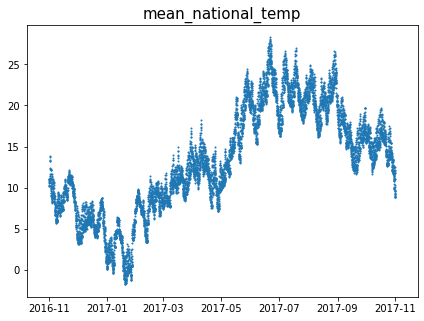

In [177]:
plt.figure(figsize = (7,5))
plt.scatter(y = data1.mean_national_temp, x = data1.index,  s=1,  )
plt.title('mean_national_temp', size = 15)

Text(0, 0.5, 'nombres')

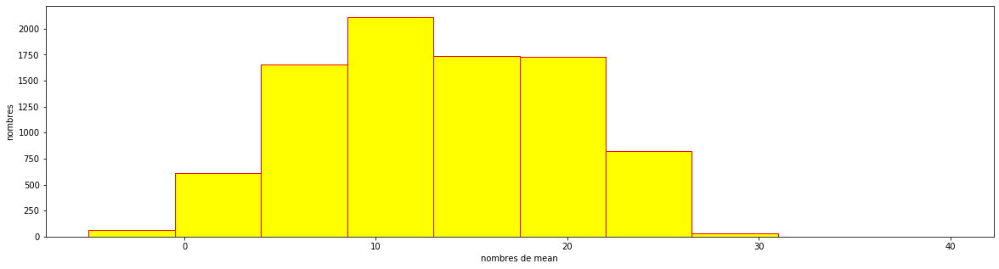

In [193]:
import matplotlib.pyplot as plt
plt.hist(data1['mean_national_temp'], range = (-5, 40), bins = 10, color = 'yellow',
            edgecolor = 'red')
plt.xlabel('nombres de mean')
plt.ylabel('nombres')


In [172]:
data1.isnull().values.any()

False

In [143]:
data1.describe()


,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,11.573689,15.238813,13.173858,77.171857,63.308578,203.025114,123.581735,235.774201,137.549543,148.529909
std,7.091480,8.436114,6.474700,16.534962,21.595612,69.792811,65.036526,99.701896,63.146689,73.263972
min,-5.700000,-7.200000,-1.800000,21.000000,12.000000,84.000000,0.000000,94.000000,38.000000,0.000000
25%,6.100000,9.100000,8.200000,66.000000,46.000000,150.000000,73.000000,166.000000,91.000000,105.000000
50%,11.450000,14.700000,12.800000,81.000000,64.000000,181.000000,107.000000,194.000000,116.000000,129.000000
75%,16.700000,21.300000,18.700000,91.000000,82.000000,252.000000,160.000000,287.250000,176.000000,181.000000
max,33.600000,39.300000,28.300000,100.000000,99.000000,464.000000,355.000000,570.000000,349.000000,542.000000


## TEMP_1 ##

**TEMP_1 ---> Difference Stationary + pas seasonality**

adf -> TS <  critical => stationnary, p-value => staionnary


kpss -> TS > critical => not stationnary

In [213]:
adf_test(data1['temp_1'])
kpss_test(data1['temp_1'])

Results of Dickey-Fuller Test:
Test Statistic                   -3.567276
p-value                           0.006418
#Lags Used                       37.000000
Number of Observations Used    8722.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic           14.790984
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



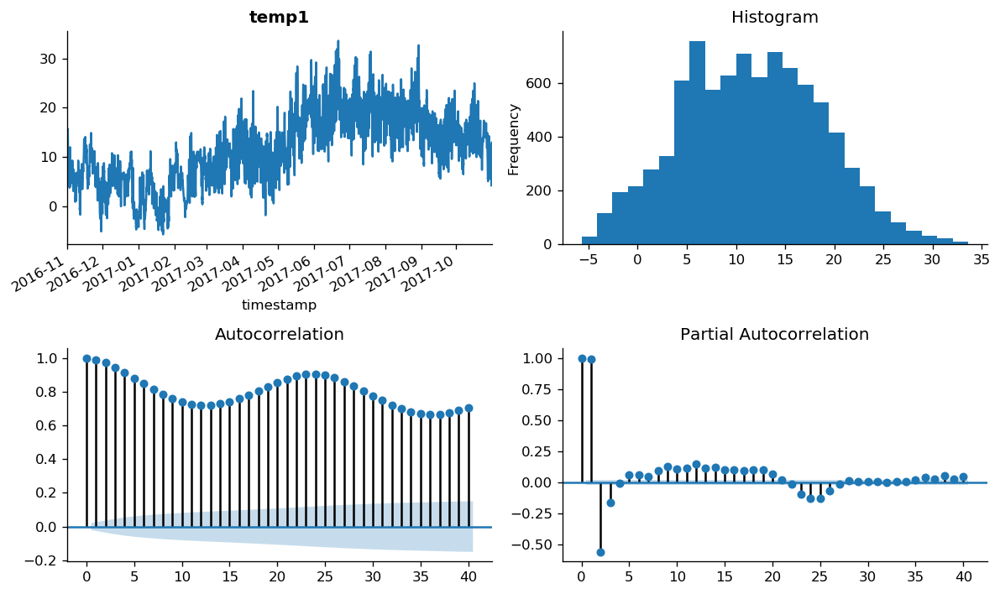

Text(0.5, 0, 'Year')

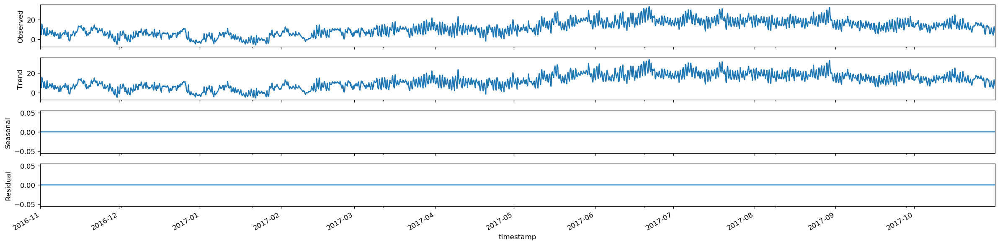

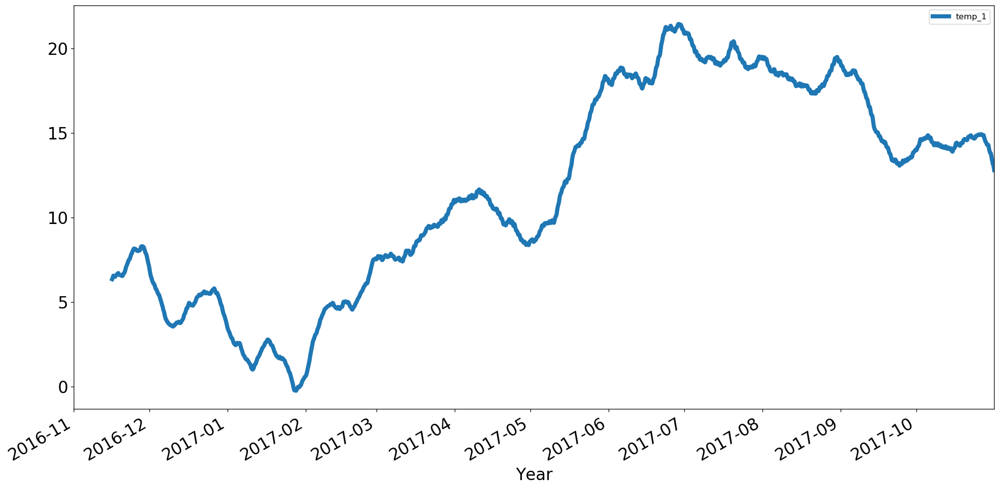

In [214]:
tsplot(data1['temp_1'], title='temp1')
decomposition  =sm.tsa.seasonal_decompose(data1['temp_1'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
temp1 = data1[['temp_1']]
temp1.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)

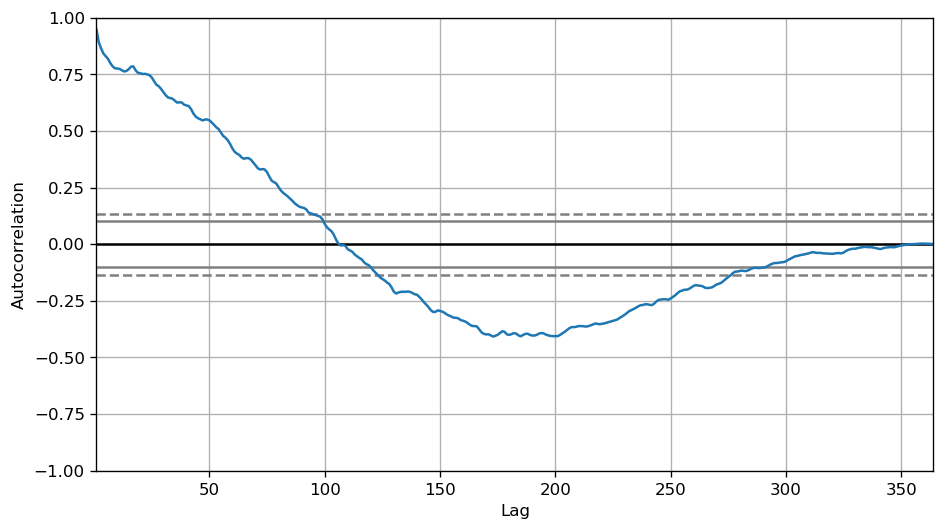

In [215]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.temp_1.tolist())

In [216]:
grangercausalitytests(data1[['consumption_1', 'temp_1']], maxlag=2)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=229.5574, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=229.6360, p=0.0000  , df=1
likelihood ratio test: chi2=226.6774, p=0.0000  , df=1
parameter F test:         F=229.5574, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=118.8238, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=237.7833, p=0.0000  , df=2
likelihood ratio test: chi2=234.6126, p=0.0000  , df=2
parameter F test:         F=118.8238, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (229.55736081093062, 3.3091387073249115e-51, 8756.0, 1),
   'ssr_chi2test': (229.6360122593583, 7.156859780656214e-52, 1),
   'lrtest': (226.67741074008518, 3.1620328819823765e-51, 1),
   'params_ftest': (229.557360810932, 3.309138707321573e-51, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (118.82378644149159, 1.2122715429935247e-51, 8753.0, 2),
   'ssr_chi2test': (237.78332495249245, 2.322774460788069e-52, 2),
   'lrtest': (234.61262956814608, 1.1337434652834604e-51, 2),
   'params_ftest': (118.82378644148866, 1.2122715429971597e-51, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

## TEMP_2 ##

**TEMP_2 ---> Difference Stationary**

adf -> TS <  critical => stationnary, p_value stationnary

kpss -> TS > critical => not stationnary

In [30]:
adf_test(data1['temp_2'])
kpss_test(data1['temp_2'])

Results of Dickey-Fuller Test:
Test Statistic                   -3.371398
p-value                           0.011973
#Lags Used                       33.000000
Number of Observations Used    8726.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic           14.319507
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



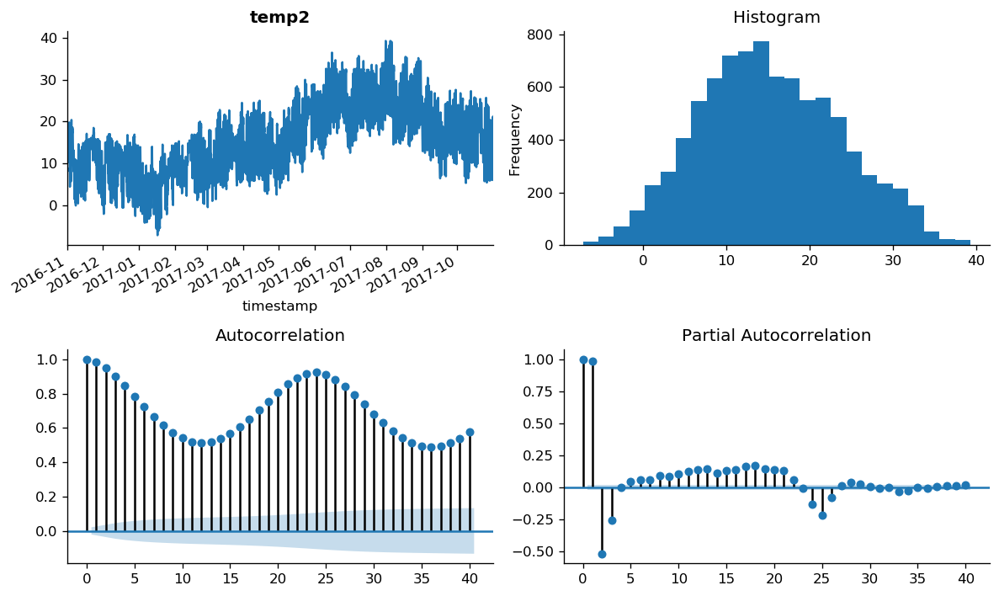

Text(0.5, 0, 'Year')

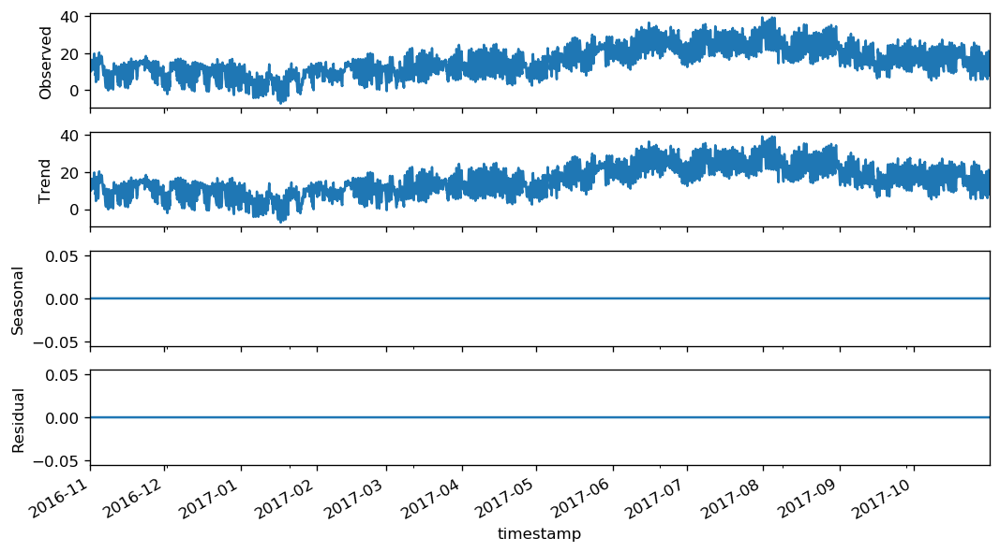

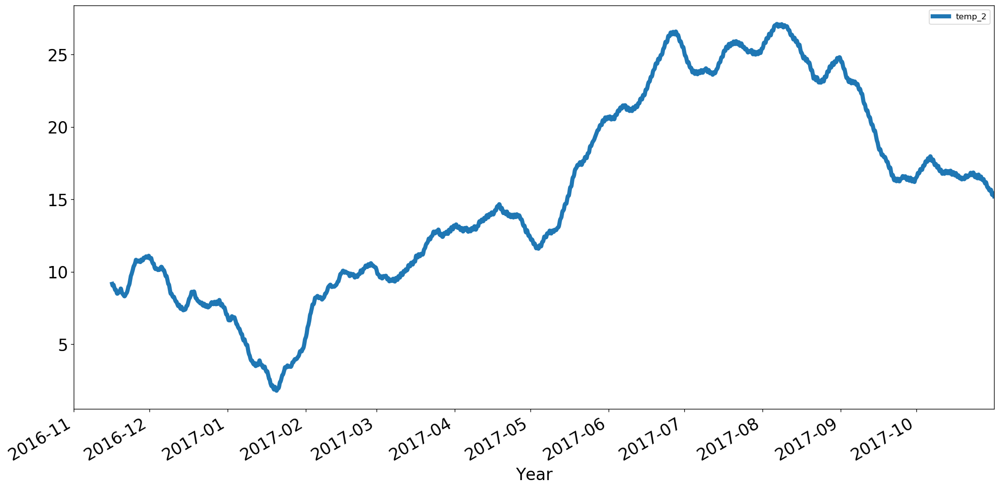

In [217]:
tsplot(data1['temp_2'], title='temp2')
decomposition  =sm.tsa.seasonal_decompose(data1['temp_2'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
temp2 = data1[['temp_2']]
temp2.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)

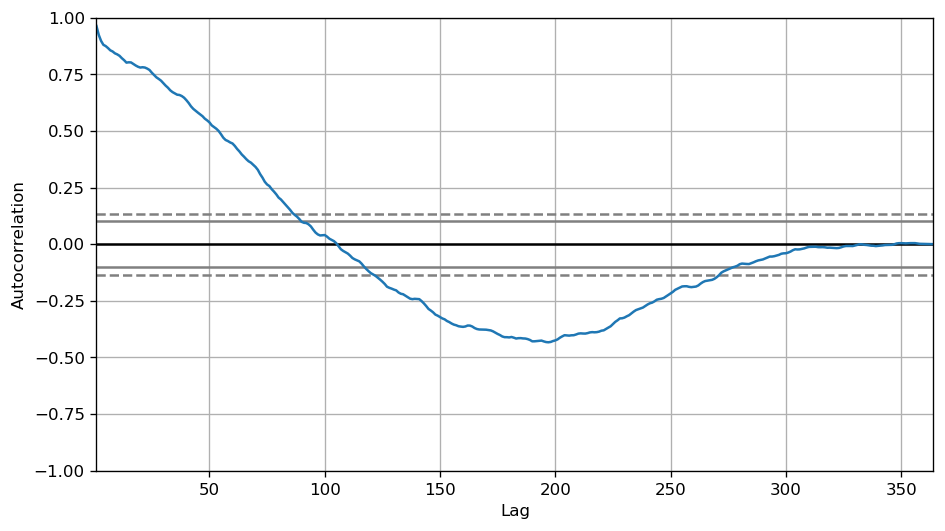

In [219]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.temp_2.tolist())

In [220]:
grangercausalitytests(data1[['consumption_2', 'temp_2']], maxlag=2)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=658.2587, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=658.4843, p=0.0000  , df=1
likelihood ratio test: chi2=634.9070, p=0.0000  , df=1
parameter F test:         F=658.2587, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=233.0765, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=466.4193, p=0.0000  , df=2
likelihood ratio test: chi2=454.4235, p=0.0000  , df=2
parameter F test:         F=233.0765, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (658.2587477143798, 4.860925228935759e-140, 8756.0, 1),
   'ssr_chi2test': (658.4842817759538, 3.191282908838834e-145, 1),
   'lrtest': (634.9070493632025, 4.281437427608799e-140, 1),
   'params_ftest': (658.2587477143924, 4.860925228907851e-140, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (233.07651636645718, 2.396241340213052e-99, 8753.0, 2),
   'ssr_chi2test': (466.41931459783666, 5.227965446758377e-102, 2),
   'lrtest': (454.4234789730399, 2.1047247950434038e-99, 2),
   'params_ftest': (233.0765163664711, 2.3962413401824045e-99, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

## Mean_national_temp ##

**Mean_national_temp ---> ?**

adf -> TS >   => not stationnary, pvalue=> not stationary

kpss -> TS > critical => not stationnary

In [221]:
adf_test(data1['mean_national_temp'])
kpss_test(data1['mean_national_temp'])

Results of Dickey-Fuller Test:
Test Statistic                   -2.307181
p-value                           0.169663
#Lags Used                       37.000000
Number of Observations Used    8722.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic           15.766045
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



In [230]:
data1['mean_national_temp'].dtypes

dtype('float64')

In [231]:
len(data1['mean_national_temp'])

8760

In [232]:
np.sum(data1['mean_national_temp'] == 0)

9

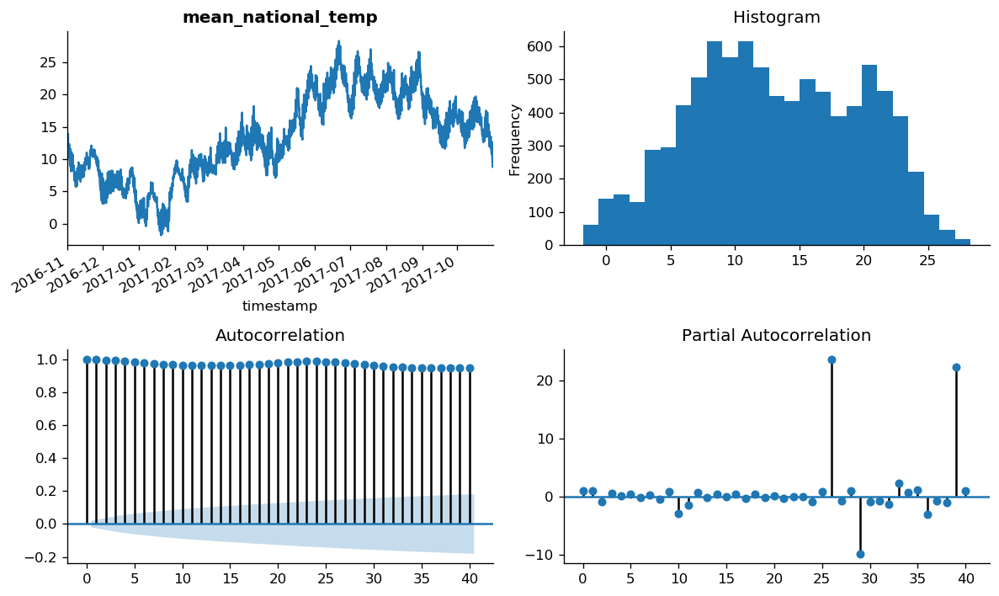

Text(0.5, 0, 'Year')

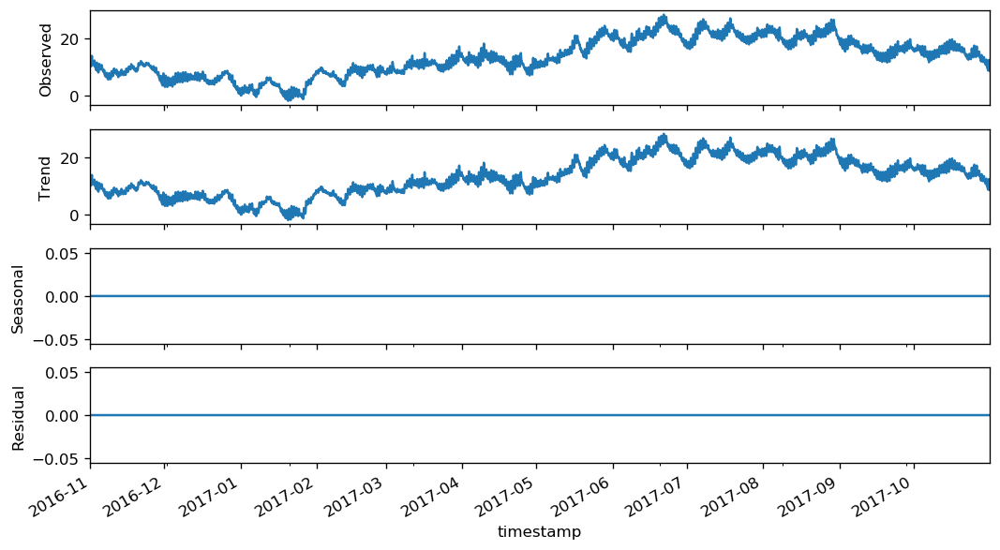

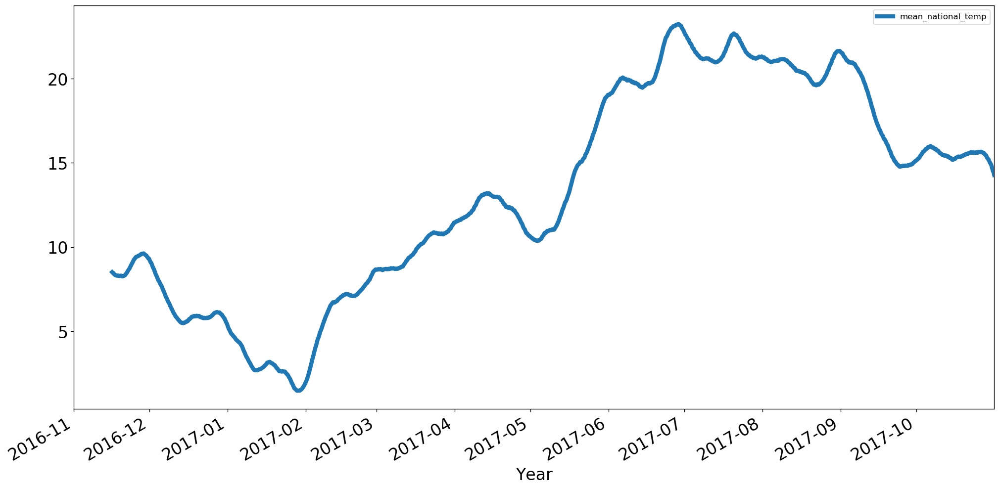

In [236]:
tsplot(data1['mean_national_temp'], title='mean_national_temp')
decomposition  =sm.tsa.seasonal_decompose(data1['mean_national_temp'], 
                                          freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
mnt = data1[['mean_national_temp']]
mnt.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=148.8791, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=148.9301, p=0.0000  , df=1
likelihood ratio test: chi2=147.6782, p=0.0000  , df=1
parameter F test:         F=148.8791, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=135.1026, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=270.3596, p=0.0000  , df=2
likelihood ratio test: chi2=266.2705, p=0.0000  , df=2
parameter F test:         F=135.1026, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (148.8791384184882, 5.746143090580672e-34, 8756.0, 1),
   'ssr_chi2test': (148.93014771671292, 2.970362050073117e-34, 1),
   'lrtest': (147.6781822641933, 5.578012012641553e-34, 1),
   'params_ftest': (148.87913841849385, 5.746143090563443e-34, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (135.1026043866654, 1.633450202135428e-58, 8753.0, 2),
   'ssr_chi2test': (270.3595588297534, 1.9596013736599224e-59, 2),
   'lrtest': (266.2704974391527, 1.5138963234114185e-58, 2),
   'params_ftest': (135.1026043866458, 1.6334502021656972e-58, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

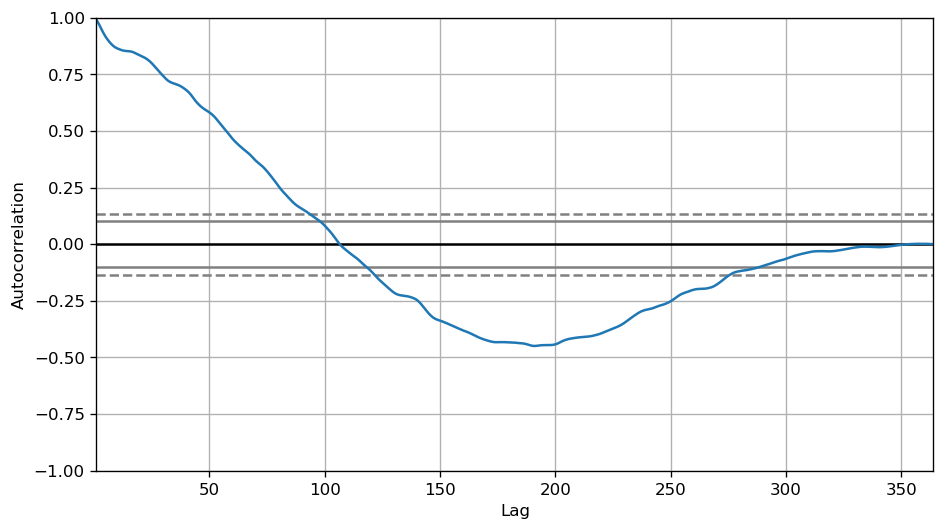

In [237]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.mean_national_temp.tolist())
grangercausalitytests(data1[['consumption_2', 'mean_national_temp']], maxlag=2)

In [235]:
grangercausalitytests(data1[['consumption_2', 'mean_national_temp']], maxlag=2)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=148.8791, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=148.9301, p=0.0000  , df=1
likelihood ratio test: chi2=147.6782, p=0.0000  , df=1
parameter F test:         F=148.8791, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=135.1026, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=270.3596, p=0.0000  , df=2
likelihood ratio test: chi2=266.2705, p=0.0000  , df=2
parameter F test:         F=135.1026, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (148.8791384184882, 5.746143090580672e-34, 8756.0, 1),
   'ssr_chi2test': (148.93014771671292, 2.970362050073117e-34, 1),
   'lrtest': (147.6781822641933, 5.578012012641553e-34, 1),
   'params_ftest': (148.87913841849385, 5.746143090563443e-34, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (135.1026043866654, 1.633450202135428e-58, 8753.0, 2),
   'ssr_chi2test': (270.3595588297534, 1.9596013736599224e-59, 2),
   'lrtest': (266.2704974391527, 1.5138963234114185e-58, 2),
   'params_ftest': (135.1026043866458, 1.6334502021656972e-58, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

## Humidity_1 ##

**Humidity_1 ---> Difference Stationary**

adf -> TS <  critical =>  stationnary, pvalue => staionary

kpss -> TS > critical => not stationnary

In [34]:
adf_test(data1['humidity_1'])
kpss_test(data1['humidity_1'])

Results of Dickey-Fuller Test:
Test Statistic                -7.130285e+00
p-value                        3.532311e-10
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            7.218734
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



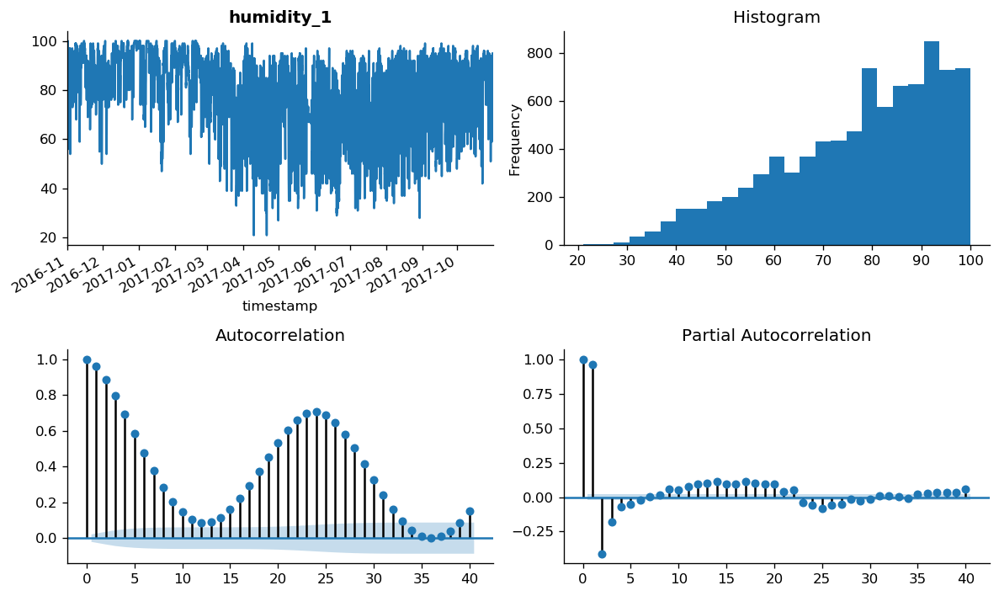

Text(0.5, 0, 'Year')

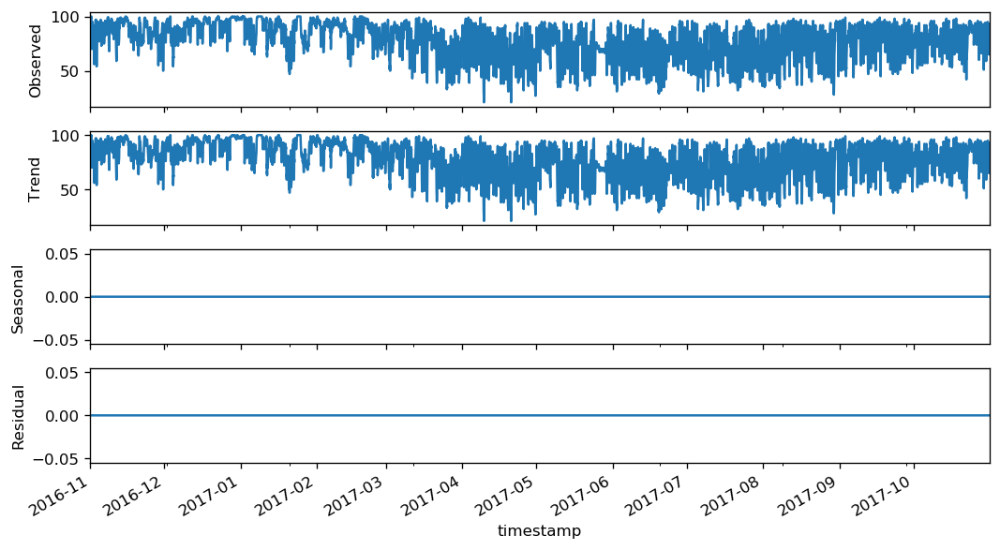

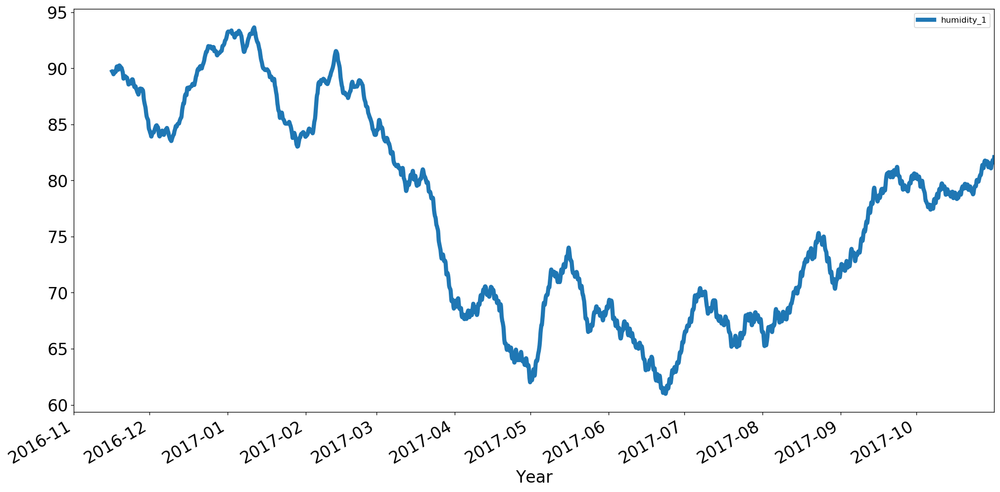

In [238]:
tsplot(data1['humidity_1'], title='humidity_1')
decomposition  =sm.tsa.seasonal_decompose(data1['humidity_1'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
hum1 = data1[['humidity_1']]
hum1.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=430.6939, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=430.8415, p=0.0000  , df=1
likelihood ratio test: chi2=420.5804, p=0.0000  , df=1
parameter F test:         F=430.6939, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=107.6131, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=215.3491, p=0.0000  , df=2
likelihood ratio test: chi2=212.7441, p=0.0000  , df=2
parameter F test:         F=107.6131, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (430.69390183992243, 1.984607868128076e-93, 8756.0, 1),
   'ssr_chi2test': (430.84146713292375, 1.0659656414569218e-95, 1),
   'lrtest': (420.5803989531705, 1.8243819879887443e-93, 1),
   'params_ftest': (430.6939018399133, 1.9846078681371575e-93, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (107.61308562761396, 6.754161094293141e-47, 8753.0, 2),
   'ssr_chi2test': (215.34911548649447, 1.7279601823120875e-47, 2),
   'lrtest': (212.74413822728093, 6.356197092479325e-47, 2),
   'params_ftest': (107.61308562761414, 6.754161094293141e-47, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

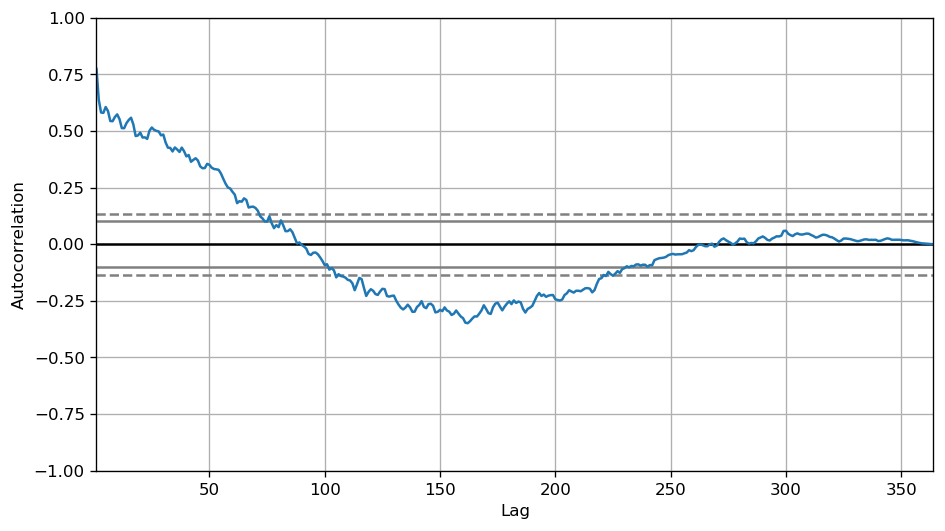

In [239]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.humidity_1.tolist())
grangercausalitytests(data1[['consumption_1', 'humidity_1']], maxlag=2)

**Humidity_2 ---> Difference Stationary**

adf -> TS < critical => stationnary, pa value stationary

kpss -> TS > critical => not stationnary


In [36]:
adf_test(data1['humidity_2'])
kpss_test(data1['humidity_2'])

Results of Dickey-Fuller Test:
Test Statistic                -7.691970e+00
p-value                        1.411420e-11
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            8.40828
p-value                   0.01000
Lags Used                37.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



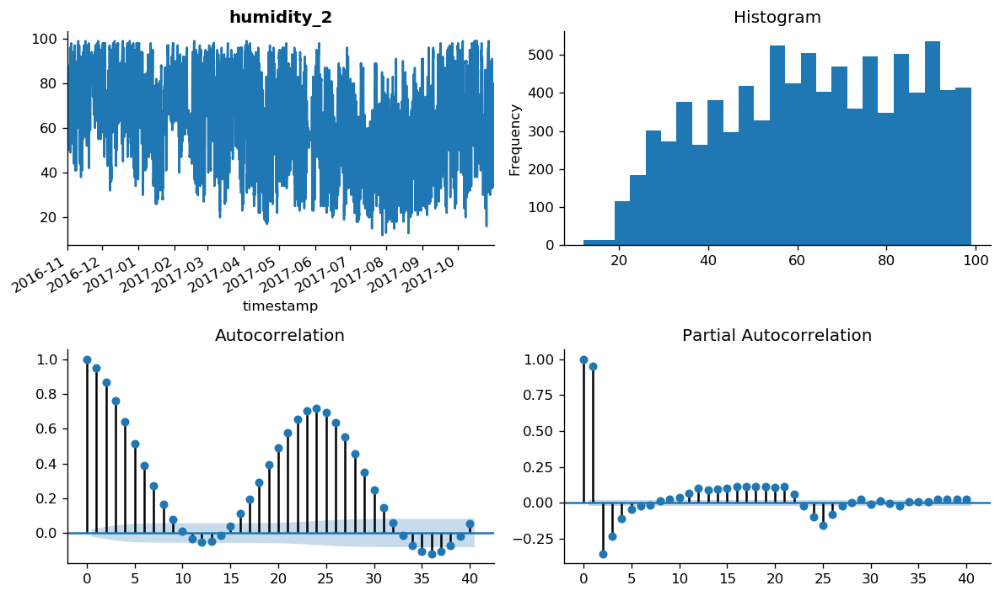

Text(0.5, 0, 'Year')

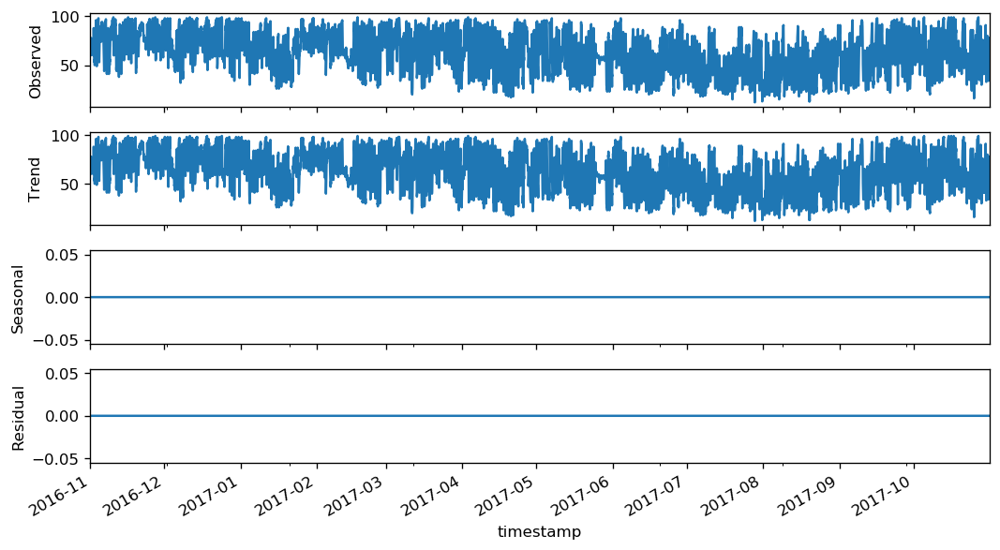

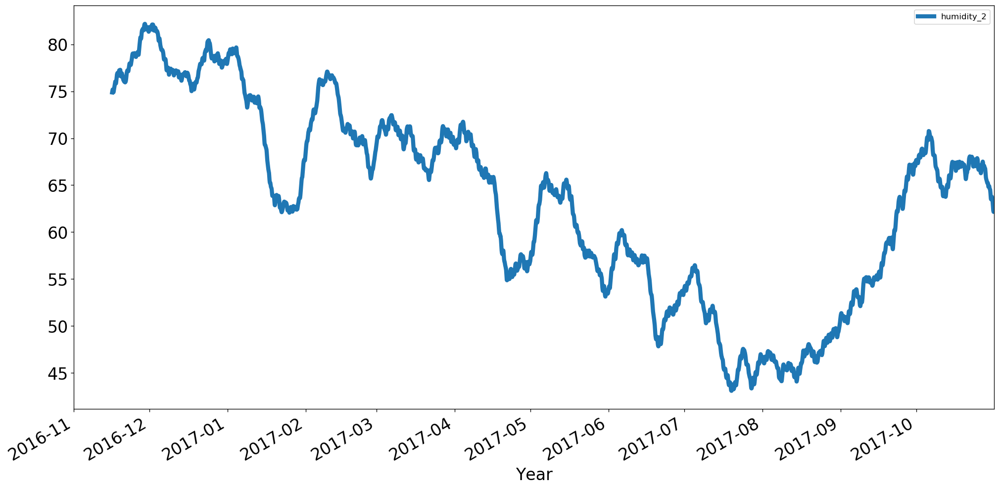

In [240]:
tsplot(data1['humidity_2'], title='humidity_2')
decomposition  =sm.tsa.seasonal_decompose(data1['humidity_2'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
hum2 = data1[['humidity_2']]
hum2.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=784.9410, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=785.2099, p=0.0000  , df=1
likelihood ratio test: chi2=751.9858, p=0.0000  , df=1
parameter F test:         F=784.9410, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=170.4178, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=341.0303, p=0.0000  , df=2
likelihood ratio test: chi2=334.5580, p=0.0000  , df=2
parameter F test:         F=170.4178, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (784.9409584638059, 1.725347340984483e-165, 8756.0, 1),
   'ssr_chi2test': (785.209896663371, 8.86611187964534e-173, 1),
   'lrtest': (751.9858480154799, 1.4845932237370552e-165, 1),
   'params_ftest': (784.9409584637208, 1.7253473410503894e-165, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (170.4177950205742, 2.4724192698080375e-73, 8753.0, 2),
   'ssr_chi2test': (341.0302864823921, 8.835155741092347e-75, 2),
   'lrtest': (334.5580306993361, 2.2472257128103663e-73, 2),
   'params_ftest': (170.41779502057315, 2.472419269810497e-73, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

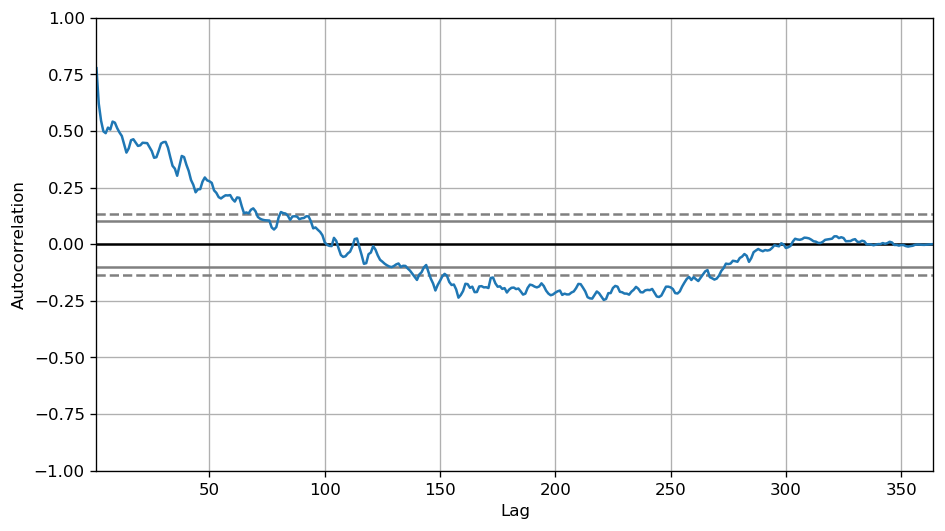

In [241]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.humidity_2.tolist())
grangercausalitytests(data1[['consumption_2', 'humidity_2']], maxlag=2)

## consumption_secondary_1##

**'consumption_secondary_1' --->diffrence**

adf -> TS > critical => stationnary, pvalue tionnary

kpss -> TS > critical => not stationnary


In [244]:
adf_test(data1['consumption_secondary_1'])
kpss_test(data1['consumption_secondary_1'])

Results of Dickey-Fuller Test:
Test Statistic                -1.094177e+01
p-value                        9.257566e-20
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            2.509934
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



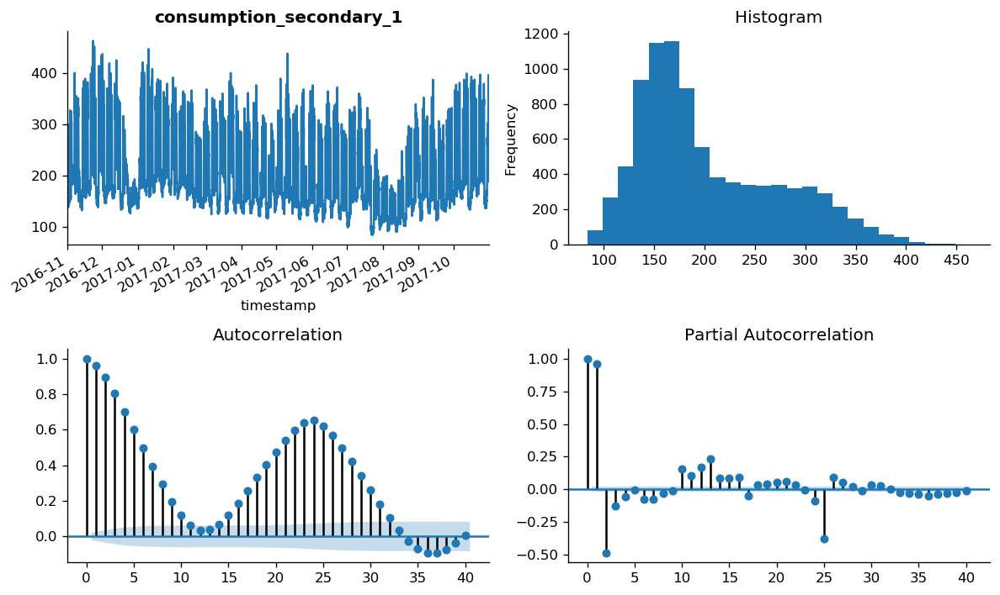

Text(0.5, 0, 'Year')

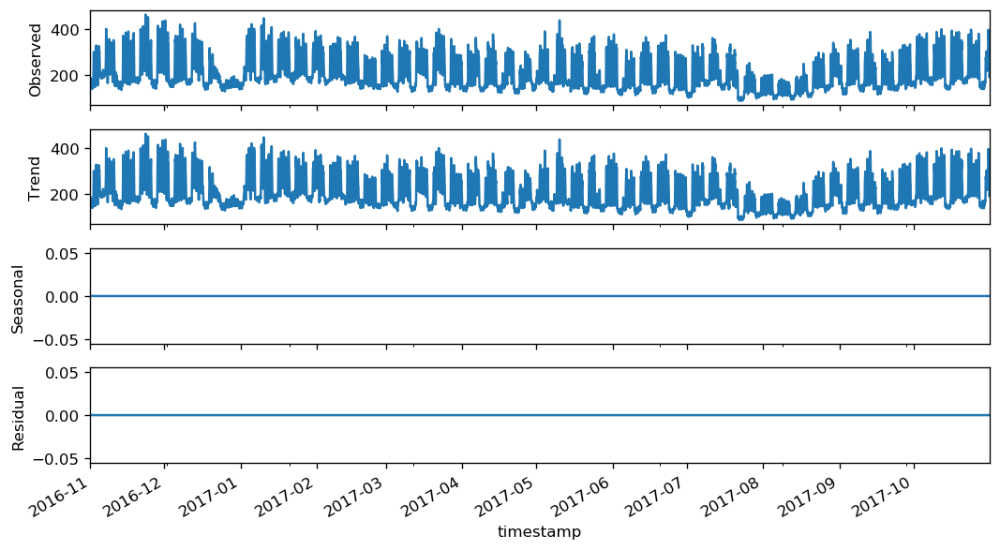

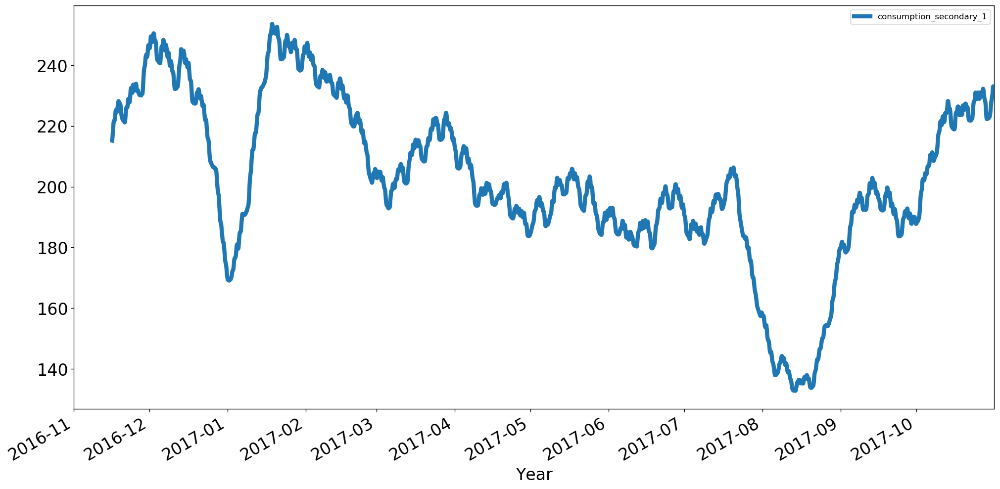

In [245]:
tsplot(data1['consumption_secondary_1'], title='consumption_secondary_1')
decomposition  =sm.tsa.seasonal_decompose(data1['consumption_secondary_1'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
cons = data1[['consumption_secondary_1']]
cons.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=270.8931, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=270.9859, p=0.0000  , df=1
likelihood ratio test: chi2=266.8786, p=0.0000  , df=1
parameter F test:         F=270.8931, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=423.4782, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=847.4403, p=0.0000  , df=2
likelihood ratio test: chi2=808.9070, p=0.0000  , df=2
parameter F test:         F=423.4782, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (270.8931344540032, 5.734040501203444e-60, 8756.0, 1),
   'ssr_chi2test': (270.9859484562145, 6.918747940046394e-61, 1),
   'lrtest': (266.8785679352586, 5.435333219778414e-60, 1),
   'params_ftest': (270.89313445413086, 5.734040500848819e-60, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (423.4782407557855, 2.8077744708770047e-176, 8753.0, 2),
   'ssr_chi2test': (847.4402907664047, 9.564868174202638e-185, 2),
   'lrtest': (808.9069787340122, 2.2288527694761653e-176, 2),
   'params_ftest': (423.47824075578126, 2.8077744708888155e-176, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

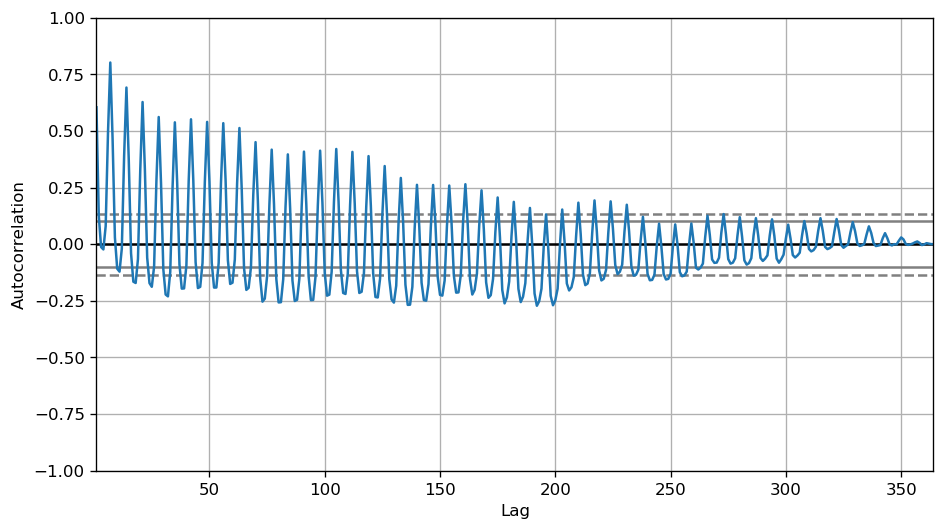

In [246]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.consumption_secondary_1.tolist())
grangercausalitytests(data1[['consumption_1', 'consumption_secondary_1']], maxlag=2)

## consumption_secondary_2##

**'consumption_secondary_2' --->differencing + sesonalite**

adf -> TS < critical => stationnary, p_value => stationnary

kpss -> TS > critical => not stationnary


In [250]:
adf_test(data1['consumption_secondary_2'])
kpss_test(data1['consumption_secondary_2'])

Results of Dickey-Fuller Test:
Test Statistic                -8.455478e+00
p-value                        1.619259e-13
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            5.074619
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



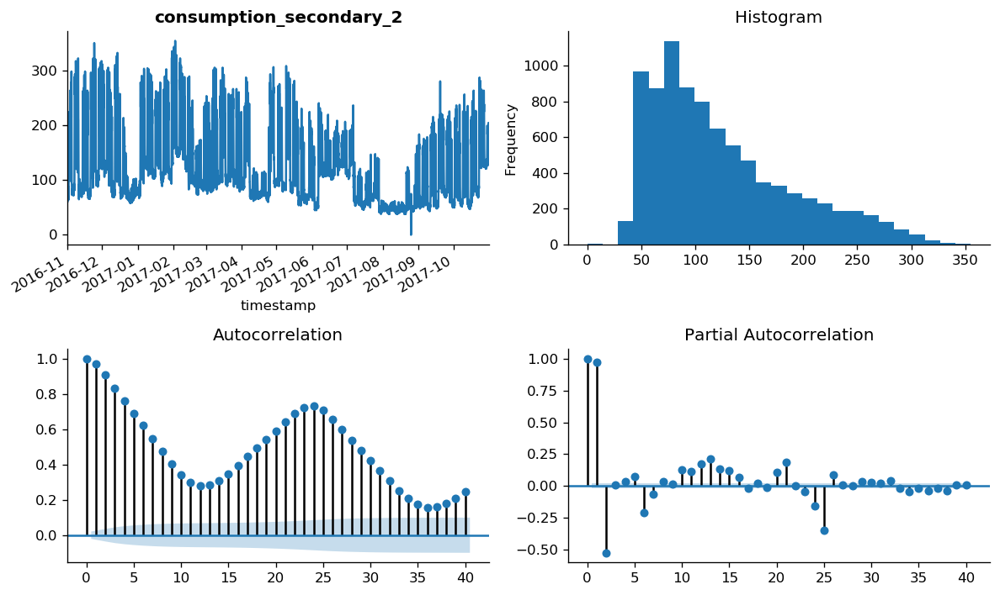

Text(0.5, 0, 'Year')

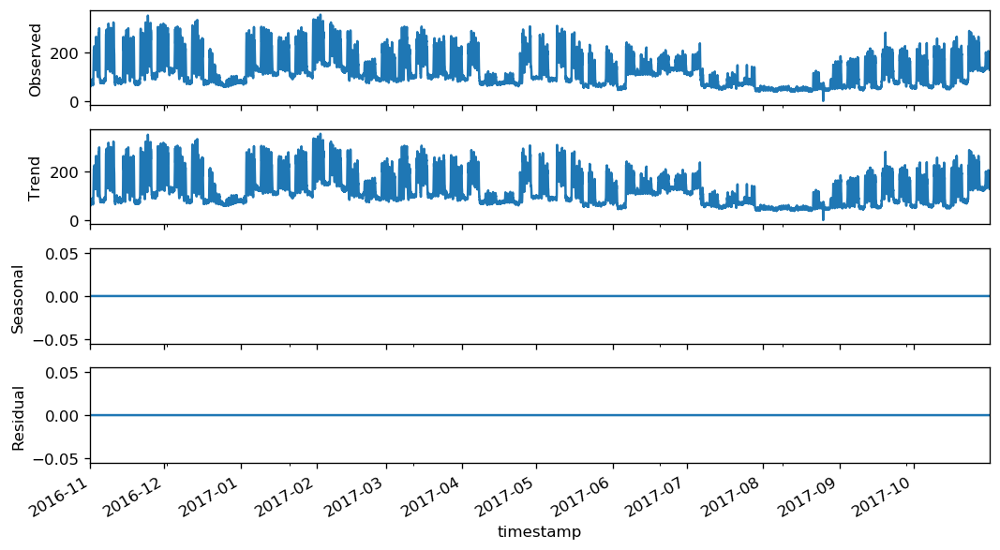

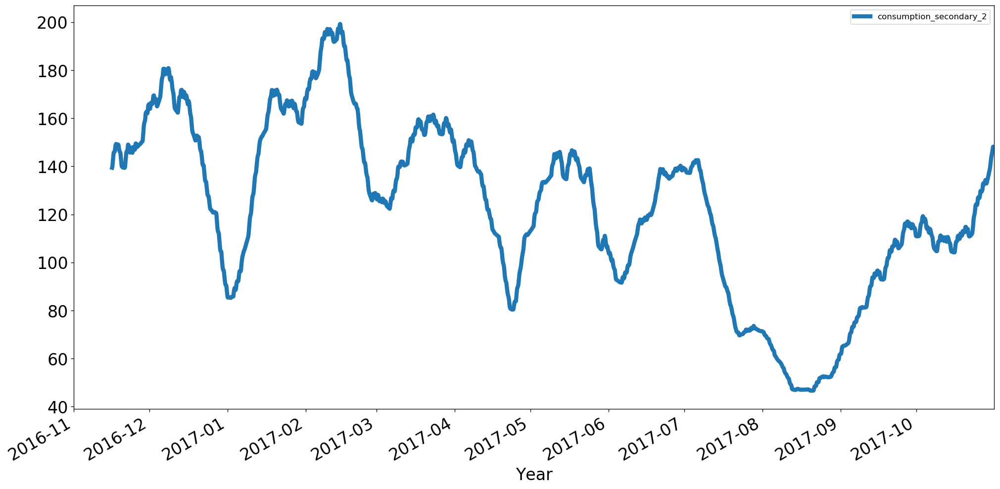

In [300]:
tsplot(data1['consumption_secondary_2'], title='consumption_secondary_2')
decomposition  =sm.tsa.seasonal_decompose(data1['consumption_secondary_2'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
cons = data1[['consumption_secondary_2']]
cons.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.1744 , p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=30.1848 , p=0.0000  , df=1
likelihood ratio test: chi2=30.1329 , p=0.0000  , df=1
parameter F test:         F=30.1744 , p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=229.8252, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=459.9129, p=0.0000  , df=2
likelihood ratio test: chi2=448.2439, p=0.0000  , df=2
parameter F test:         F=229.8252, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (30.17441582854687, 4.0594894570314794e-08, 8756.0, 1),
   'ssr_chi2test': (30.18475425333966, 3.927849965167429e-08, 1),
   'lrtest': (30.132862967031542, 4.034364373901906e-08, 1),
   'params_ftest': (30.174415828548007, 4.0594894570314794e-08, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (229.8251706869055, 5.2559019615330635e-98, 8753.0, 2),
   'ssr_chi2test': (459.9129086886595, 1.3526355588553442e-100, 2),
   'lrtest': (448.243880359747, 4.6246418657926755e-98, 2),
   'params_ftest': (229.82517068686806, 5.255901961718297e-98, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

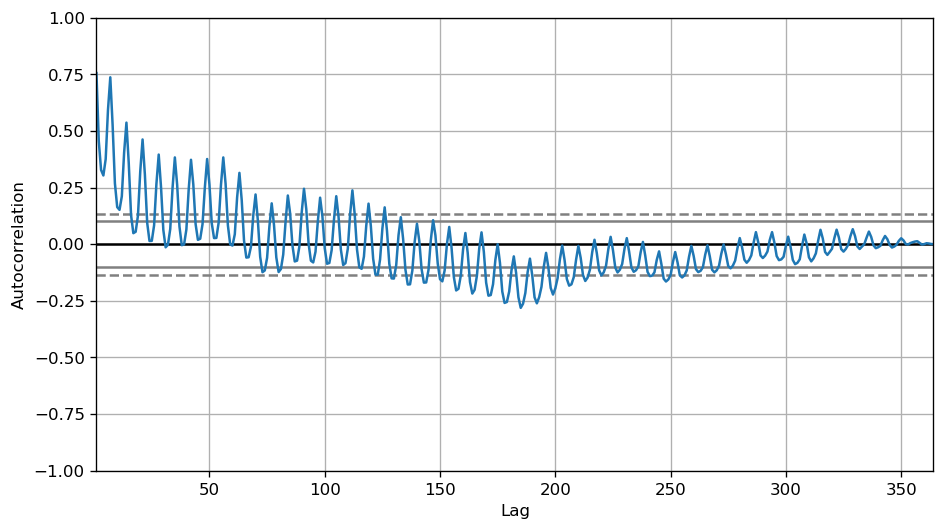

In [253]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.consumption_secondary_2.tolist())
grangercausalitytests(data1[['consumption_1', 'consumption_secondary_2']], maxlag=2)

## consumption_secondary_3##

**'consumption_secondary_3' --->differencing**

adf -> TS < critical => stationnary, pvalue=. stionnary

kpss -> TS > critical => not stationnary


In [256]:
adf_test(data1['consumption_secondary_3'])
kpss_test(data1['consumption_secondary_3'])

Results of Dickey-Fuller Test:
Test Statistic                -9.555919e+00
p-value                        2.499232e-16
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            5.220702
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



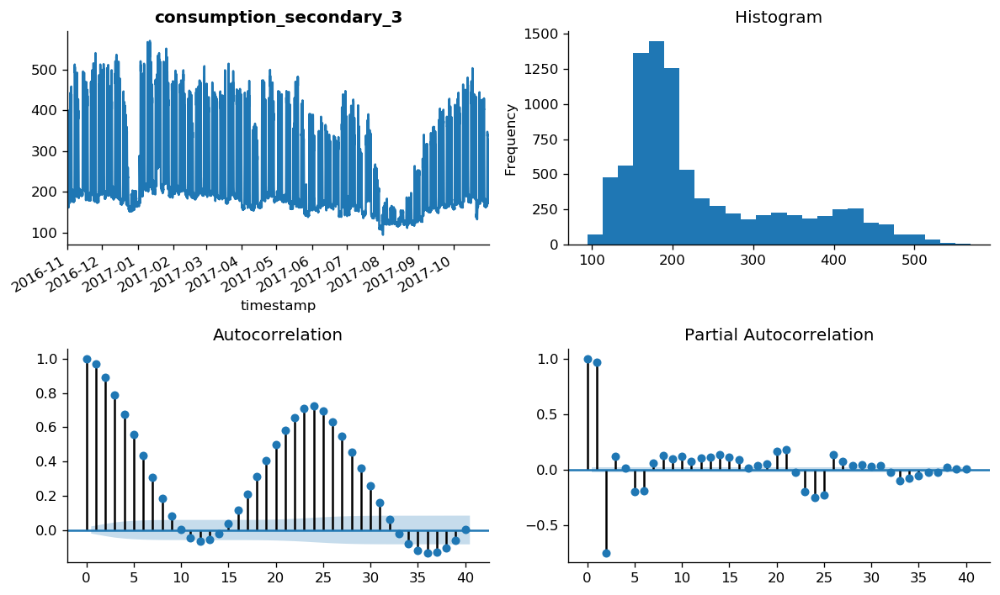

Text(0.5, 0, 'Year')

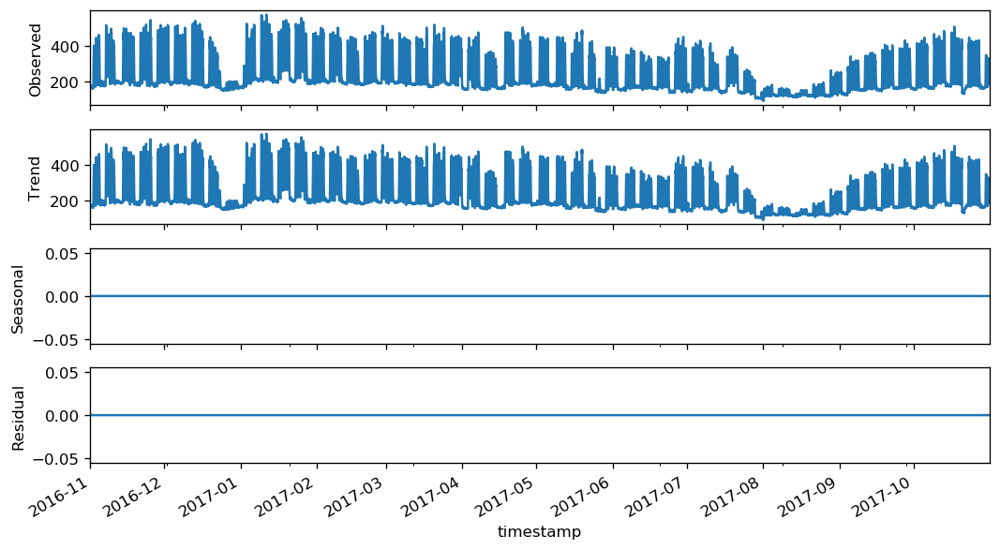

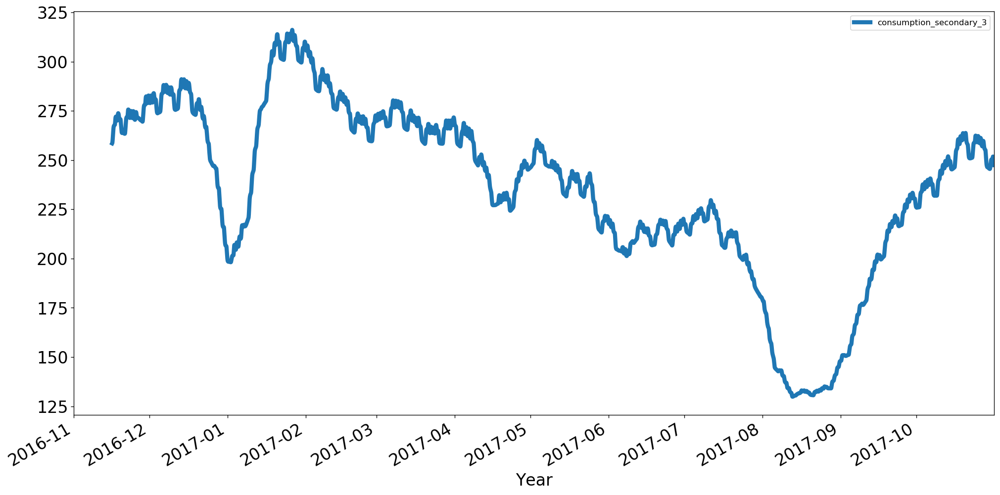

In [257]:
tsplot(data1['consumption_secondary_3'], title='consumption_secondary_3')
decomposition  =sm.tsa.seasonal_decompose(data1['consumption_secondary_3'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
cons = data1[['consumption_secondary_3']]
cons.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.3451 , p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=30.3555 , p=0.0000  , df=1
likelihood ratio test: chi2=30.3030 , p=0.0000  , df=1
parameter F test:         F=30.3451 , p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=189.5695, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=379.3556, p=0.0000  , df=2
likelihood ratio test: chi2=371.3694, p=0.0000  , df=2
parameter F test:         F=189.5695, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (30.345115824228294, 3.7186164593696416e-08, 8756.0, 1),
   'ssr_chi2test': (30.35551273462947, 3.596832995798721e-08, 1),
   'lrtest': (30.303033358301036, 3.6954752730434974e-08, 1),
   'params_ftest': (30.34511582427847, 3.718616459271654e-08, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (189.56950924619161, 2.536234147522204e-81, 8753.0, 2),
   'ssr_chi2test': (379.3555951052544, 4.207064625360081e-83, 2),
   'lrtest': (371.36944160662824, 2.281131813449351e-81, 2),
   'params_ftest': (189.56950924619153, 2.536234147522204e-81, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

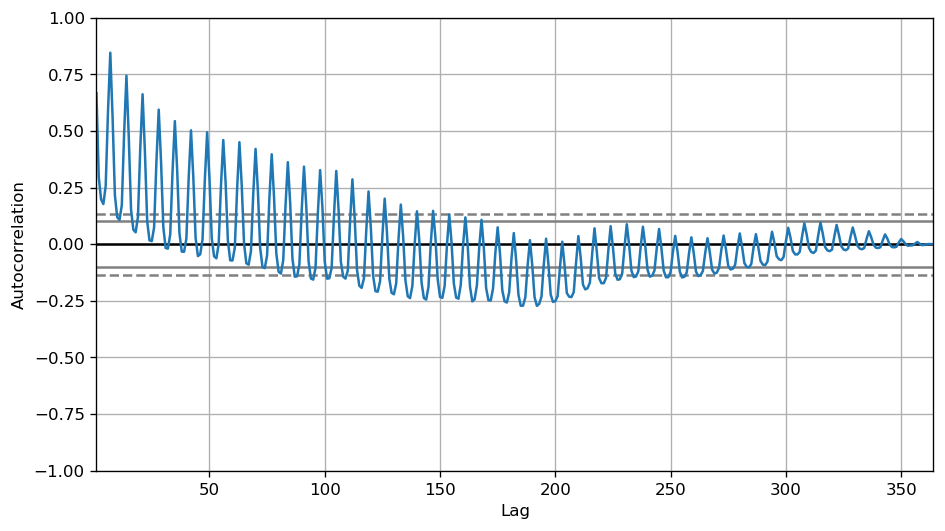

In [258]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.consumption_secondary_3.tolist())
grangercausalitytests(data1[['consumption_1', 'consumption_secondary_3']], maxlag=2)

## consumption_1##

**'consumption_1' --->differencing**

adf -> TS < critical => stationnary, pvalue => stionary

kpss -> TS > critical => not stationnary


In [259]:
adf_test(data1['consumption_1'])
kpss_test(data1['consumption_1'])

Results of Dickey-Fuller Test:
Test Statistic                -8.125894e+00
p-value                        1.123480e-12
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            8.00514
p-value                   0.01000
Lags Used                37.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



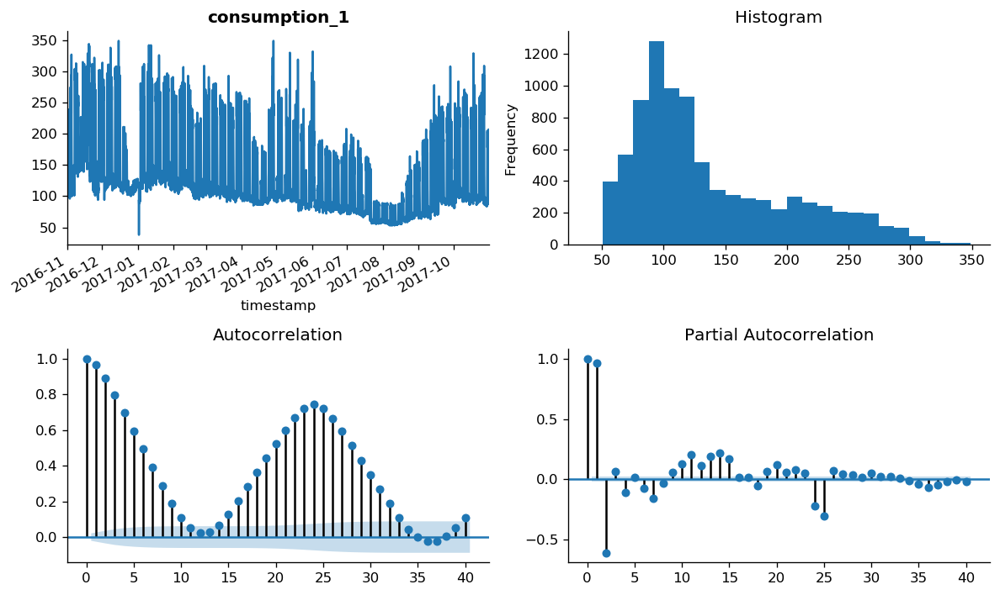

Text(0.5, 0, 'Year')

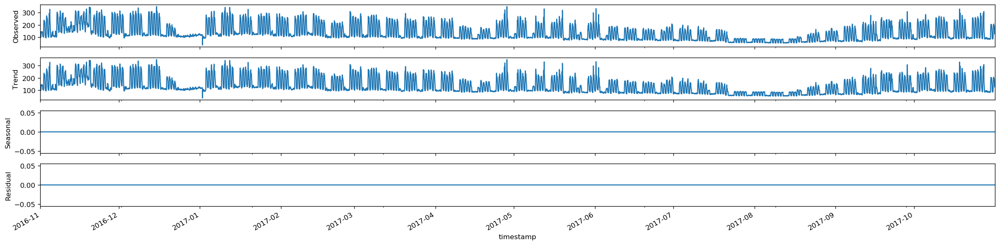

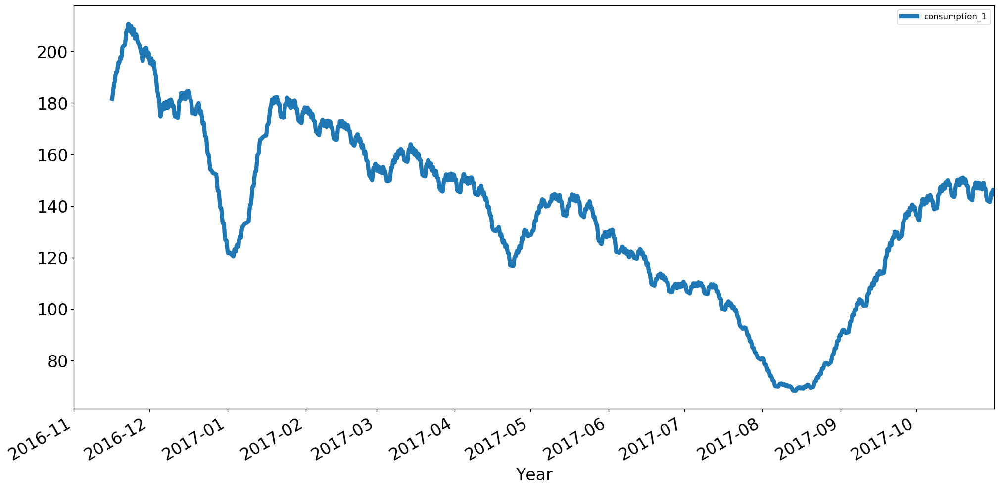

In [262]:
tsplot(data1['consumption_1'], title='consumption_1')
decomposition  =sm.tsa.seasonal_decompose(data1['consumption_1'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
cons = data1[['consumption_1']]
cons.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=286.3806, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=286.4788, p=0.0000  , df=1
likelihood ratio test: chi2=281.8936, p=0.0000  , df=1
parameter F test:         F=286.3806, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=577.4156, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=1155.4909, p=0.0000  , df=2
likelihood ratio test: chi2=1085.3700, p=0.0000  , df=2
parameter F test:         F=577.4156, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (286.38063972145835, 3.072527517280333e-63, 8756.0, 1),
   'ssr_chi2test': (286.47876008682664, 2.909501167791616e-64, 1),
   'lrtest': (281.8935700380389, 2.9037505029957026e-63, 1),
   'params_ftest': (286.38063972146085, 3.0725275172757044e-63, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (577.415619917941, 2.8148273113470973e-236, 8753.0, 2),
   'ssr_chi2test': (1155.4909172263972, 1.2255622622767937e-251, 2),
   'lrtest': (1085.3700069655897, 2.0648931129702975e-236, 2),
   'params_ftest': (577.4156199179056, 2.8148273114350996e-236, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

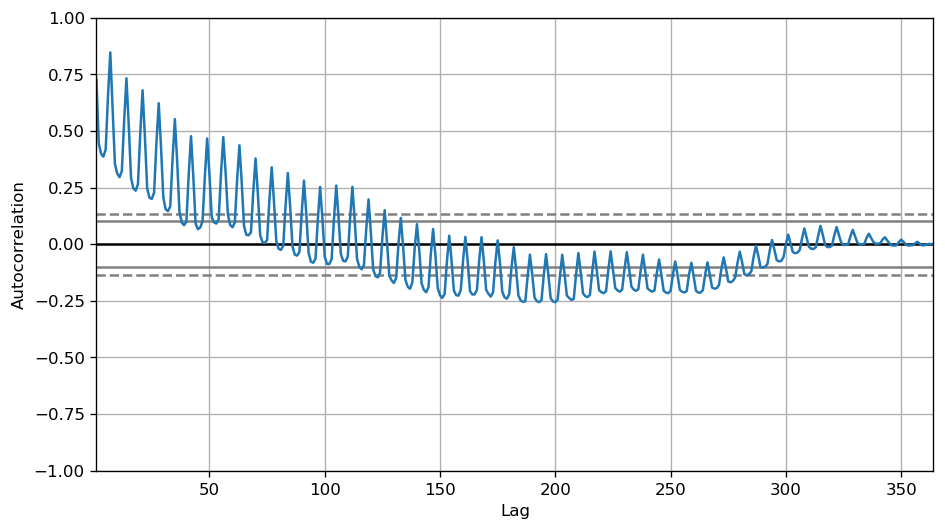

In [263]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.consumption_1.tolist())
grangercausalitytests(data1[['consumption_2', 'consumption_1']], maxlag=2)

## consumption_2##

**'consumption_1' --->differencing**

adf -> TS < critical => stationnary, pvalue stationary

kpss -> TS > critical => not stationnary


In [46]:
adf_test(data1['consumption_2'])
kpss_test(data1['consumption_2'])

Results of Dickey-Fuller Test:
Test Statistic                   -4.688609
p-value                           0.000088
#Lags Used                       37.000000
Number of Observations Used    8722.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic            8.407722
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



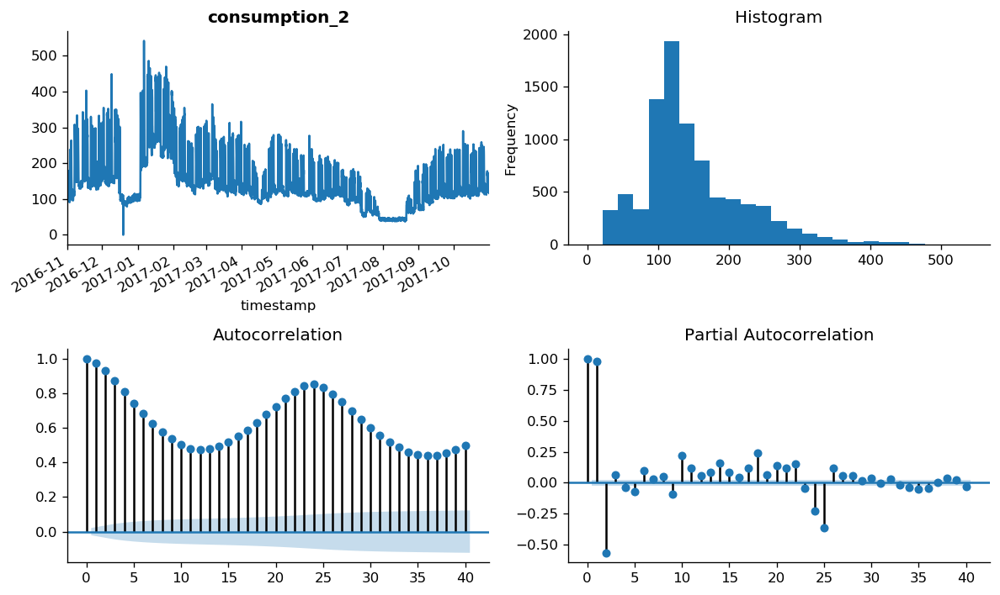

Text(0.5, 0, 'Year')

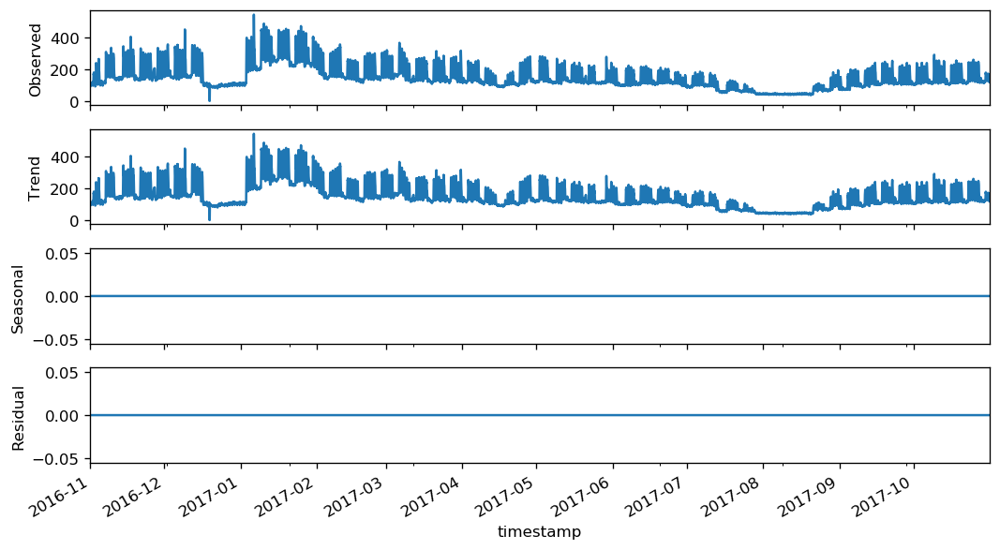

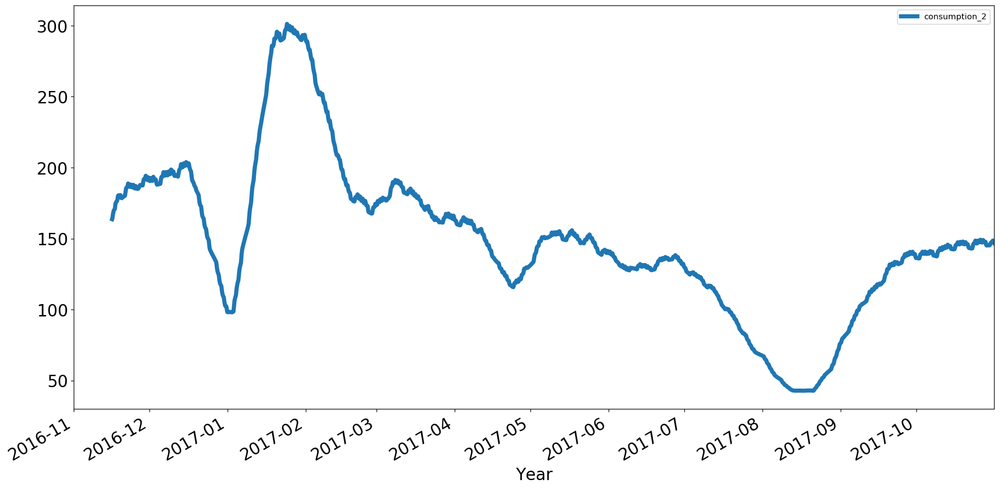

In [264]:
tsplot(data1['consumption_2'], title='consumption_2')
decomposition  =sm.tsa.seasonal_decompose(data1['consumption_2'], freq=1, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['figure.figsize'] = [20, 5.0]
cons = data1[['consumption_2']]
cons.rolling(365).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=451.2408, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=451.3954, p=0.0000  , df=1
likelihood ratio test: chi2=440.1489, p=0.0000  , df=1
parameter F test:         F=451.2408, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=257.4248, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=515.1436, p=0.0000  , df=2
likelihood ratio test: chi2=500.5623, p=0.0000  , df=2
parameter F test:         F=257.4248, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (451.240826447994, 1.0972392508501376e-97, 8756.0, 1),
   'ssr_chi2test': (451.39543157354717, 3.5845289583850183e-100, 1),
   'lrtest': (440.1488697731693, 1.0047231990355506e-97, 1),
   'params_ftest': (451.2408264479998, 1.0972392508473309e-97, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (257.42475282927734, 2.3244610601862687e-109, 8753.0, 2),
   'ssr_chi2test': (515.1436045421709, 1.3740026799174912e-112, 2),
   'lrtest': (500.5623482006631, 2.0149634091831198e-109, 2),
   'params_ftest': (257.4247528292789, 2.324461060181512e-109, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

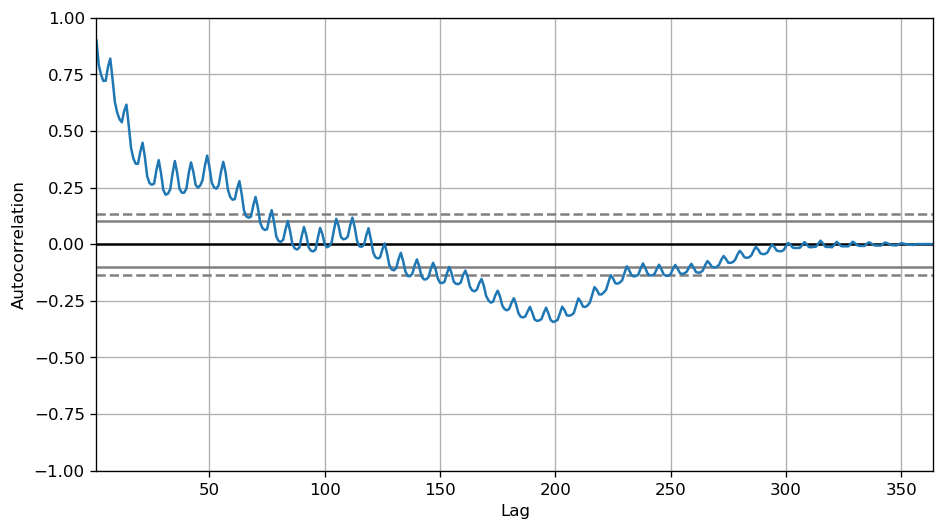

In [265]:
#voir la sesonalite
# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.consumption_2.tolist())
grangercausalitytests(data1[['consumption_1', 'consumption_2']], maxlag=2)

## c/c: tous differencing pour les temp et enlevre sesonalite pour les consump

In [266]:
#visualisation
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss


def test_stationarity1(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(24).mean()
    rolstd = timeseries.rolling(24).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
        
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    
    #perforn KSSP test:
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c')
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)
    
    


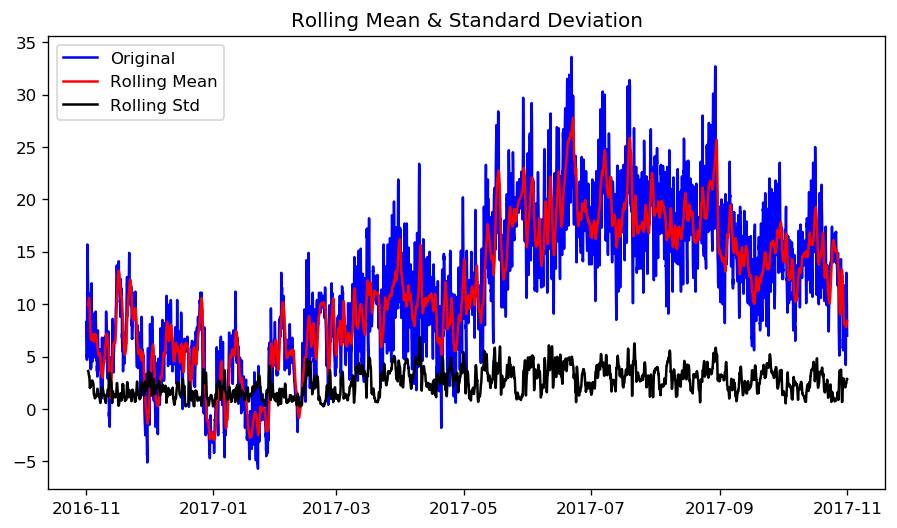

Results of Dickey-Fuller Test:
Test Statistic                   -3.567276
p-value                           0.006418
#Lags Used                       37.000000
Number of Observations Used    8722.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic           14.790984
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



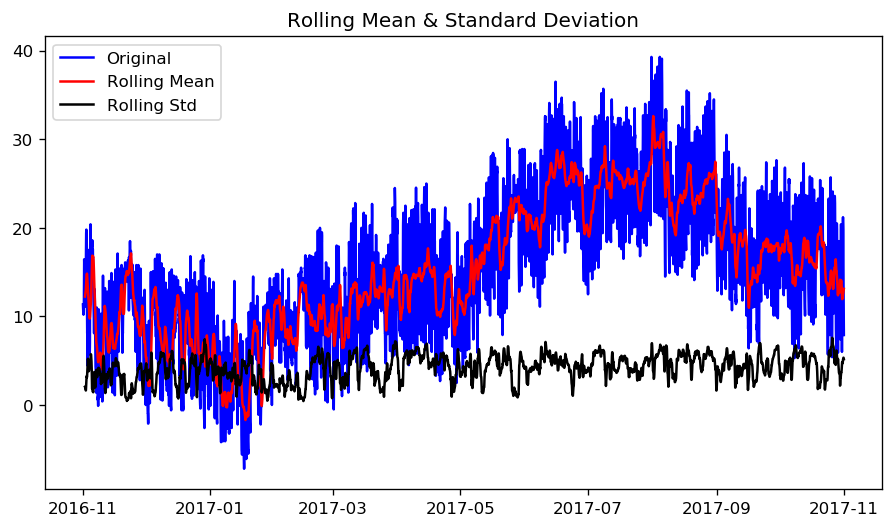

Results of Dickey-Fuller Test:
Test Statistic                   -3.371398
p-value                           0.011973
#Lags Used                       33.000000
Number of Observations Used    8726.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic           14.319507
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



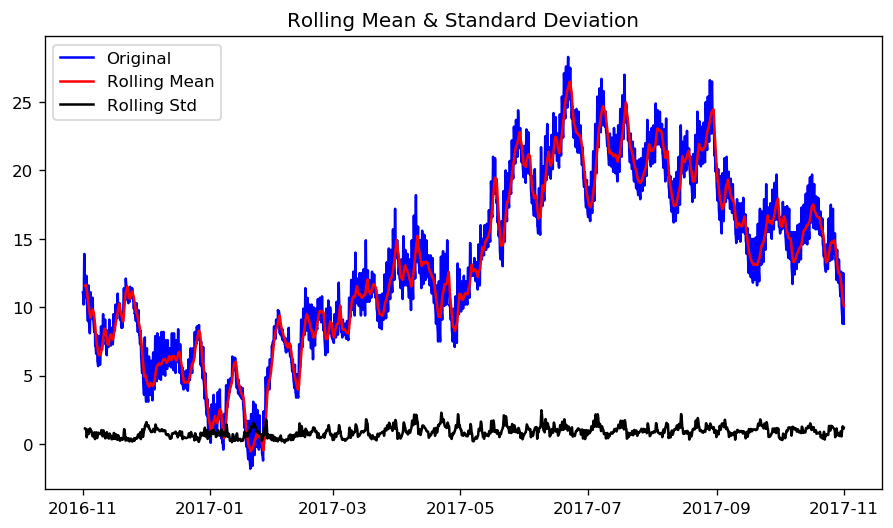

Results of Dickey-Fuller Test:
Test Statistic                   -2.307181
p-value                           0.169663
#Lags Used                       37.000000
Number of Observations Used    8722.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic           15.766045
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



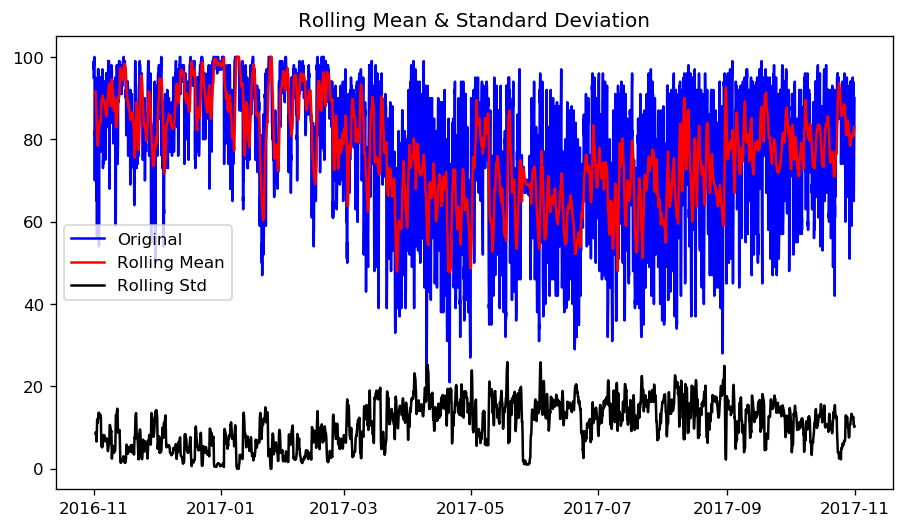

Results of Dickey-Fuller Test:
Test Statistic                -7.130285e+00
p-value                        3.532311e-10
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            7.218734
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



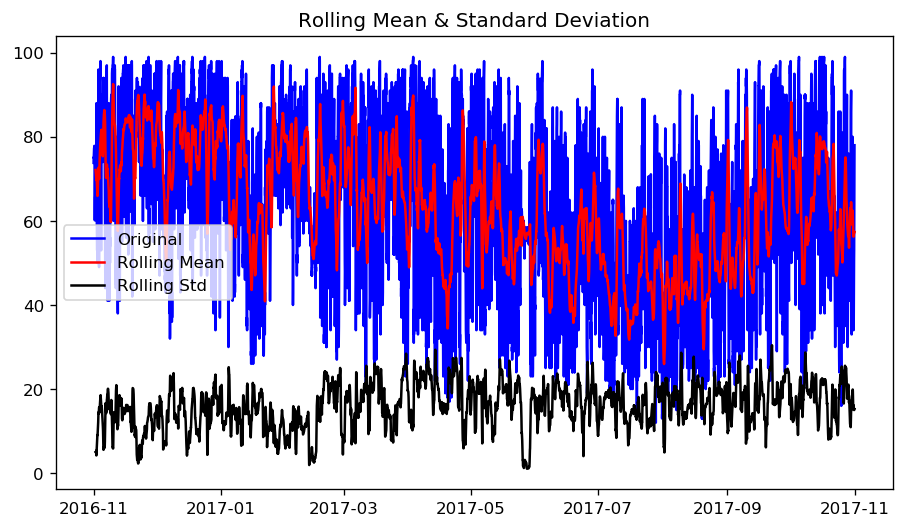

Results of Dickey-Fuller Test:
Test Statistic                -7.691970e+00
p-value                        1.411420e-11
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            8.40828
p-value                   0.01000
Lags Used                37.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



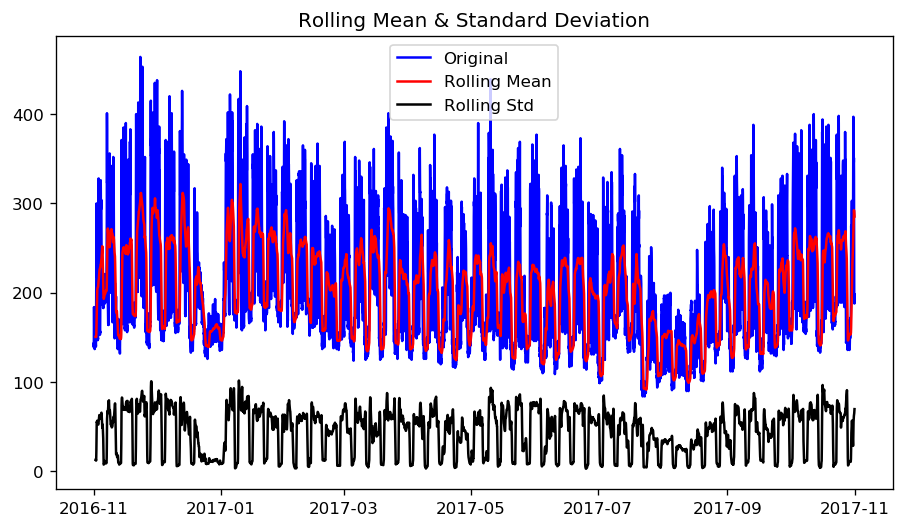

Results of Dickey-Fuller Test:
Test Statistic                -1.094177e+01
p-value                        9.257566e-20
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            2.509934
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



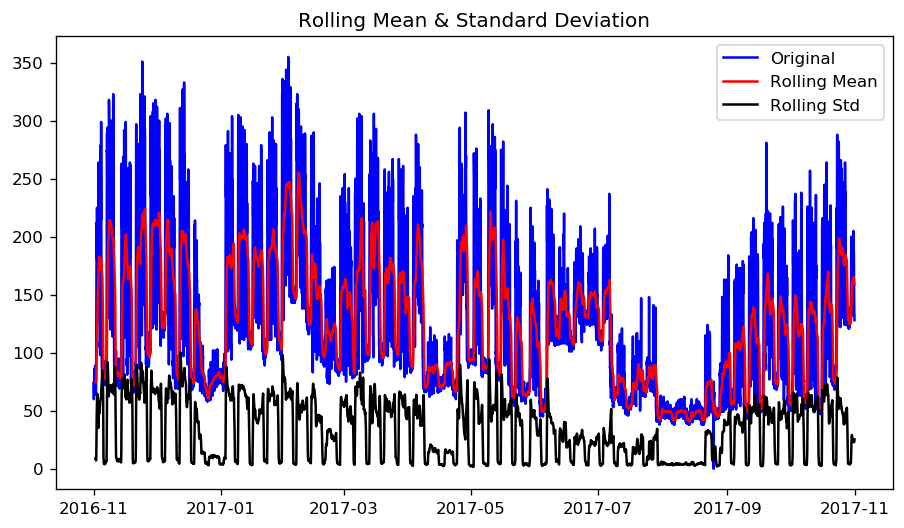

Results of Dickey-Fuller Test:
Test Statistic                -8.455478e+00
p-value                        1.619259e-13
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            5.074619
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



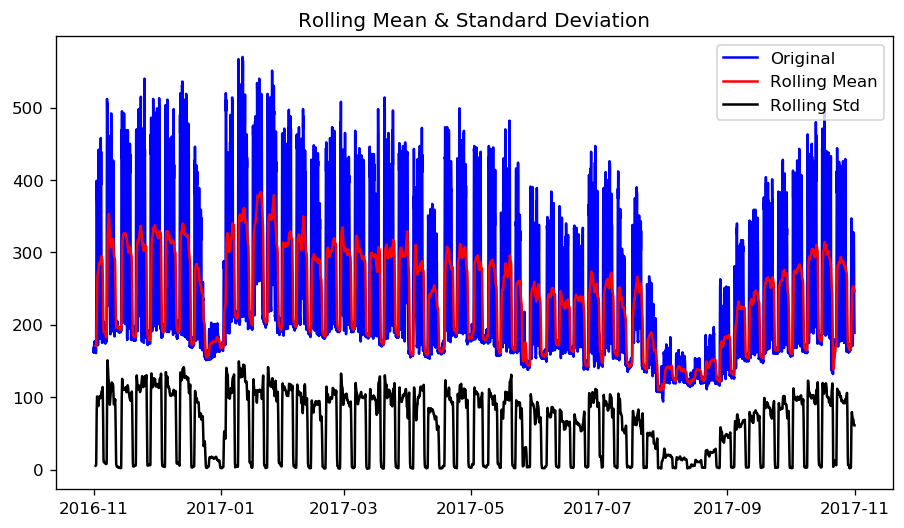

Results of Dickey-Fuller Test:
Test Statistic                -9.555919e+00
p-value                        2.499232e-16
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            5.220702
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



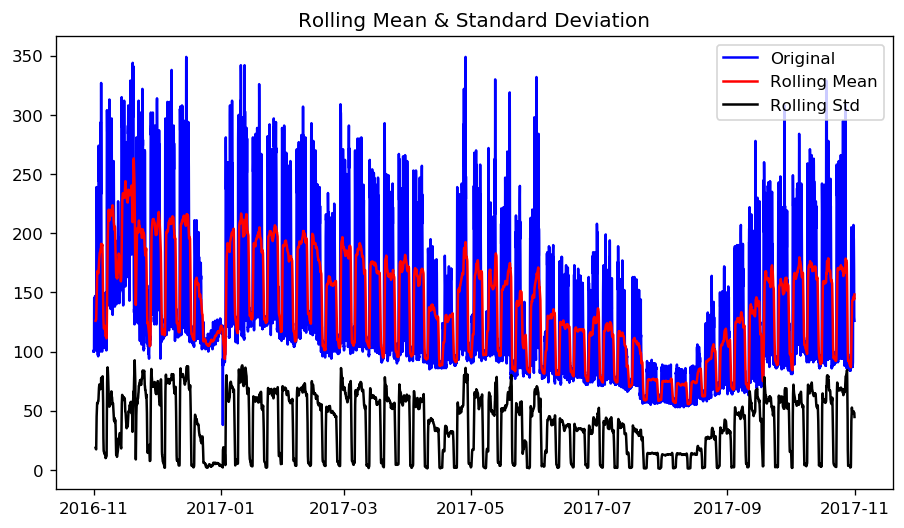

Results of Dickey-Fuller Test:
Test Statistic                -8.125894e+00
p-value                        1.123480e-12
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64
Results of KPSS Test:
Test Statistic            8.00514
p-value                   0.01000
Lags Used                37.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



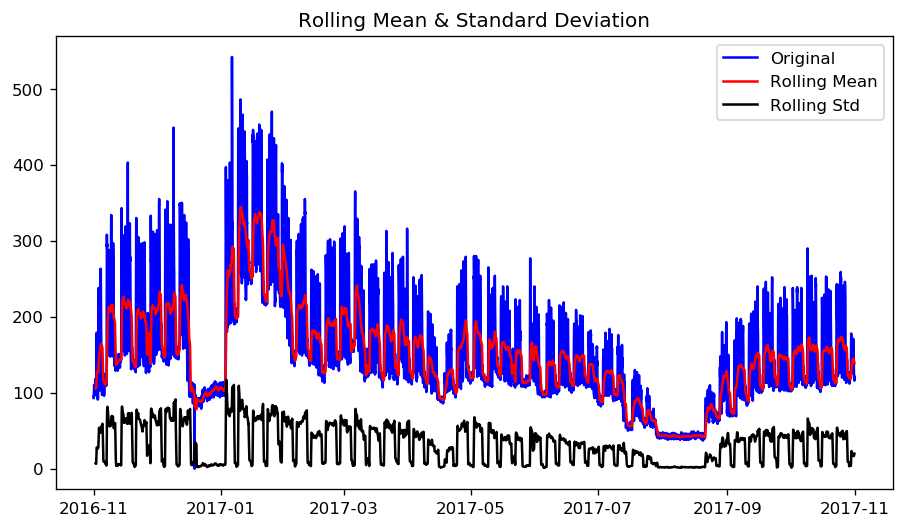

Results of Dickey-Fuller Test:
Test Statistic                   -4.688609
p-value                           0.000088
#Lags Used                       37.000000
Number of Observations Used    8722.000000
Critical Value (1%)              -3.431100
Critical Value (5%)              -2.861871
Critical Value (10%)             -2.566946
dtype: float64
Results of KPSS Test:
Test Statistic            8.407722
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1707: InterpolationWarning:

p-value is smaller than the indicated p-value



temp_1                     None
temp_2                     None
mean_national_temp         None
humidity_1                 None
humidity_2                 None
consumption_secondary_1    None
consumption_secondary_2    None
consumption_secondary_3    None
consumption_1              None
consumption_2              None
dtype: object

In [267]:
# Loop to check all columns of the DF
import functools
data1.apply(functools.partial(test_stationarity1))

In [268]:
print(data1.describe())

            temp_1       temp_2  mean_national_temp   humidity_1   humidity_2  \
count  8760.000000  8760.000000         8760.000000  8760.000000  8760.000000   
mean     11.573689    15.238813           13.173858    77.171857    63.308578   
std       7.091480     8.436114            6.474700    16.534962    21.595612   
min      -5.700000    -7.200000           -1.800000    21.000000    12.000000   
25%       6.100000     9.100000            8.200000    66.000000    46.000000   
50%      11.450000    14.700000           12.800000    81.000000    64.000000   
75%      16.700000    21.300000           18.700000    91.000000    82.000000   
max      33.600000    39.300000           28.300000   100.000000    99.000000   

       consumption_secondary_1  consumption_secondary_2  \
count              8760.000000              8760.000000   
mean                203.025114               123.581735   
std                  69.792811                65.036526   
min                  84.000000    

In [269]:
import statsmodels.api as sm
import matplotlib

Dickey-Fuller: Test statistic LESS critical value => stationnary

KSS : test statistic Greater critical value => non stationnary


    Case 1: Both tests conclude that the series is not stationary -> series is not stationary
    Case 2: Both tests conclude that the series is stationary -> series is stationary
    Case 3: KPSS = stationary and ADF = not stationary  -> trend stationary, remove the trend to make series strict stationary
    Case 4: KPSS = not stationary and ADF = stationary -> difference stationary, use differencing to make series stationary


In [270]:
data1.columns

Index(['temp_1', 'temp_2', 'mean_national_temp', 'humidity_1', 'humidity_2',
       'consumption_secondary_1', 'consumption_secondary_2',
       'consumption_secondary_3', 'consumption_1', 'consumption_2'],
      dtype='object')

In [271]:
#checking stationarity
from statsmodels.tsa.vector_ar.vecm import coint_johansen

coint_johansen(data1,-1,1).eig

array([1.73162976e-01, 8.97915472e-02, 7.48957385e-02, 5.46005616e-02,
       4.64298498e-02, 3.96631246e-02, 3.31367965e-02, 1.56306437e-02,
       3.49729942e-03, 9.83352219e-05])

differencing

In [272]:
data1.describe()

,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,11.573689,15.238813,13.173858,77.171857,63.308578,203.025114,123.581735,235.774201,137.549543,148.529909
std,7.091480,8.436114,6.474700,16.534962,21.595612,69.792811,65.036526,99.701896,63.146689,73.263972
min,-5.700000,-7.200000,-1.800000,21.000000,12.000000,84.000000,0.000000,94.000000,38.000000,0.000000
25%,6.100000,9.100000,8.200000,66.000000,46.000000,150.000000,73.000000,166.000000,91.000000,105.000000
50%,11.450000,14.700000,12.800000,81.000000,64.000000,181.000000,107.000000,194.000000,116.000000,129.000000
75%,16.700000,21.300000,18.700000,91.000000,82.000000,252.000000,160.000000,287.250000,176.000000,181.000000
max,33.600000,39.300000,28.300000,100.000000,99.000000,464.000000,355.000000,570.000000,349.000000,542.000000


In [273]:
def DeckeyFuller(timeseries):
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries.iloc[:, 0].values, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

In [274]:
trans = data1.copy()

In [275]:
trans.columns

Index(['temp_1', 'temp_2', 'mean_national_temp', 'humidity_1', 'humidity_2',
       'consumption_secondary_1', 'consumption_secondary_2',
       'consumption_secondary_3', 'consumption_1', 'consumption_2'],
      dtype='object')

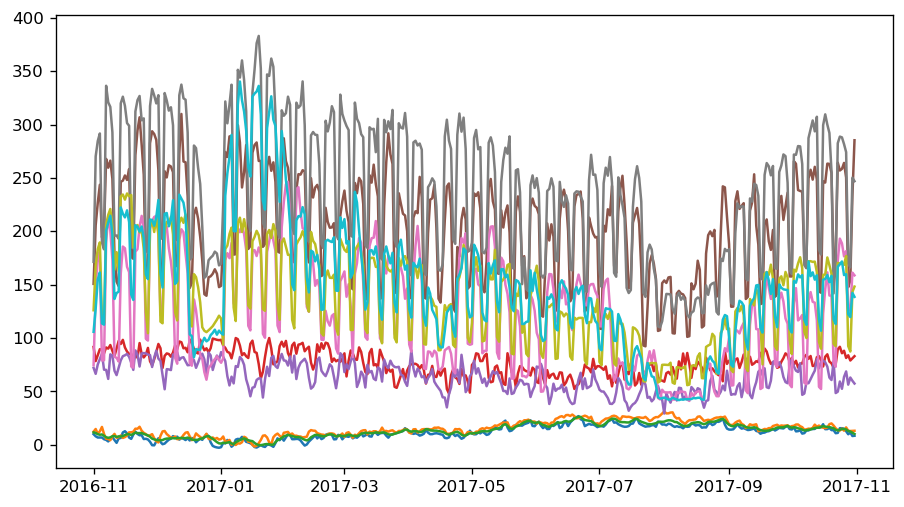

In [276]:
resamp = trans.resample('D').mean()
plt.plot(resamp)

In [277]:
resamp.head(2)

,temp_1,temp_2,mean_national_temp,humidity_1,humidity_2,consumption_secondary_1,consumption_secondary_2,consumption_secondary_3,consumption_1,consumption_2
timestamp,,,,,,,,,,
2016-11-01,9.912500,12.240876,11.558333,91.625000,72.102577,150.75,74.625000,171.416667,126.041667,105.833333
2016-11-02,7.916667,14.772193,11.062500,78.416667,66.466468,205.75,144.208333,270.250000,167.708333,127.583333


In [278]:
adf_test(resamp['temp_1'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.058730
p-value                          0.261430
#Lags Used                       4.000000
Number of Observations Used    360.000000
Critical Value (1%)             -3.448646
Critical Value (5%)             -2.869602
Critical Value (10%)            -2.571065
dtype: float64


In [279]:
resamp['temp_1_diff'] = pd.Series(resamp['temp_1'].diff(1).dropna())
resamp['temp_1_diff'].dropna(inplace=True)
adf_test(resamp['temp_1_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -1.287174e+01
p-value                        4.862931e-24
#Lags Used                     3.000000e+00
Number of Observations Used    3.600000e+02
Critical Value (1%)           -3.448646e+00
Critical Value (5%)           -2.869602e+00
Critical Value (10%)          -2.571065e+00
dtype: float64


In [280]:
adf_test(resamp['temp_2'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.325869
p-value                          0.617256
#Lags Used                      15.000000
Number of Observations Used    349.000000
Critical Value (1%)             -3.449227
Critical Value (5%)             -2.869857
Critical Value (10%)            -2.571201
dtype: float64


In [281]:
resamp['temp_2_diff'] = pd.Series(resamp['temp_2'].diff(1).dropna())
resamp['temp_2_diff'].dropna(inplace=True)
adf_test(resamp['temp_2_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -7.304814e+00
p-value                        1.309916e-10
#Lags Used                     1.300000e+01
Number of Observations Used    3.500000e+02
Critical Value (1%)           -3.449173e+00
Critical Value (5%)           -2.869833e+00
Critical Value (10%)          -2.571188e+00
dtype: float64


In [282]:
adf_test(resamp['humidity_1'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.070987
p-value                          0.256340
#Lags Used                       9.000000
Number of Observations Used    355.000000
Critical Value (1%)             -3.448906
Critical Value (5%)             -2.869716
Critical Value (10%)            -2.571126
dtype: float64


In [283]:
resamp['humidity_1_diff'] = pd.Series(resamp['humidity_1'].diff(1).dropna())
resamp['humidity_1_diff'].dropna(inplace=True)
adf_test(resamp['humidity_1_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -1.013388e+01
p-value                        8.772568e-18
#Lags Used                     8.000000e+00
Number of Observations Used    3.550000e+02
Critical Value (1%)           -3.448906e+00
Critical Value (5%)           -2.869716e+00
Critical Value (10%)          -2.571126e+00
dtype: float64


In [284]:
adf_test(resamp['humidity_2'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.448956
p-value                          0.128393
#Lags Used                       7.000000
Number of Observations Used    357.000000
Critical Value (1%)             -3.448801
Critical Value (5%)             -2.869670
Critical Value (10%)            -2.571101
dtype: float64


In [285]:
resamp['humidity_2_diff'] = pd.Series(resamp['humidity_2'].diff(1).dropna())
resamp['humidity_2_diff'].dropna(inplace=True)
adf_test(resamp['humidity_2_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -1.245730e+01
p-value                        3.467882e-23
#Lags Used                     6.000000e+00
Number of Observations Used    3.570000e+02
Critical Value (1%)           -3.448801e+00
Critical Value (5%)           -2.869670e+00
Critical Value (10%)          -2.571101e+00
dtype: float64


In [290]:
adf_test(resamp['consumption_secondary_1'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.635687
p-value                          0.085843
#Lags Used                      14.000000
Number of Observations Used    350.000000
Critical Value (1%)             -3.449173
Critical Value (5%)             -2.869833
Critical Value (10%)            -2.571188
dtype: float64


In [303]:
result_mul = seasonal_decompose(resamp['consumption_secondary_1'], model='multiplicative', extrapolate_trend='freq')
deseasonalized = resamp['consumption_secondary_1'] / result_mul.seasonal

resamp['consumption_secondary_1_diff'] = pd.Series(deseasonalized.diff(1).dropna())
resamp['consumption_secondary_1_diff'].dropna(inplace=True)
adf_test(resamp['consumption_secondary_1_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -7.011561e+00
p-value                        6.900586e-10
#Lags Used                     1.100000e+01
Number of Observations Used    3.520000e+02
Critical Value (1%)           -3.449065e+00
Critical Value (5%)           -2.869786e+00
Critical Value (10%)          -2.571163e+00
dtype: float64


In [292]:
adf_test(resamp['consumption_secondary_2'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.934763
p-value                          0.041452
#Lags Used                      14.000000
Number of Observations Used    350.000000
Critical Value (1%)             -3.449173
Critical Value (5%)             -2.869833
Critical Value (10%)            -2.571188
dtype: float64


In [305]:
result_mul = seasonal_decompose(resamp['consumption_secondary_2'], model='multiplicative', extrapolate_trend='freq')
deseasonalized = resamp['consumption_secondary_2'] / result_mul.seasonal

resamp['consumption_secondary_2_diff'] = pd.Series(deseasonalized.diff(1).dropna())


resamp['consumption_secondary_2_diff'].dropna(inplace=True)
adf_test(resamp['consumption_secondary_2_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -7.861160e+00
p-value                        5.279740e-12
#Lags Used                     6.000000e+00
Number of Observations Used    3.570000e+02
Critical Value (1%)           -3.448801e+00
Critical Value (5%)           -2.869670e+00
Critical Value (10%)          -2.571101e+00
dtype: float64


In [306]:
adf_test(resamp['consumption_secondary_3'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.129826
p-value                          0.232692
#Lags Used                      14.000000
Number of Observations Used    350.000000
Critical Value (1%)             -3.449173
Critical Value (5%)             -2.869833
Critical Value (10%)            -2.571188
dtype: float64


In [307]:
result_mul = seasonal_decompose(resamp['consumption_secondary_3'], model='multiplicative', extrapolate_trend='freq')
deseasonalized = resamp['consumption_secondary_3'] / result_mul.seasonal

resamp['consumption_secondary_3_diff'] = pd.Series(deseasonalized.diff(1).dropna())

resamp['consumption_secondary_3_diff'].dropna(inplace=True)
adf_test(resamp['consumption_secondary_3_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -8.644141e+00
p-value                        5.326948e-14
#Lags Used                     6.000000e+00
Number of Observations Used    3.570000e+02
Critical Value (1%)           -3.448801e+00
Critical Value (5%)           -2.869670e+00
Critical Value (10%)          -2.571101e+00
dtype: float64


In [308]:
adf_test(resamp['consumption_1'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.918604
p-value                          0.323360
#Lags Used                      13.000000
Number of Observations Used    351.000000
Critical Value (1%)             -3.449119
Critical Value (5%)             -2.869810
Critical Value (10%)            -2.571176
dtype: float64


In [309]:
# Time Series Decomposition
result_mul = seasonal_decompose(resamp['consumption_1'], model='multiplicative', extrapolate_trend='freq')
deseasonalized = resamp['consumption_1'] / result_mul.seasonal

resamp['consumption_1_diff'] = pd.Series(deseasonalized.diff(1).dropna())

resamp['consumption_1_diff'].dropna(inplace=True)
adf_test(resamp['consumption_1_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -6.656151e+00
p-value                        4.978449e-09
#Lags Used                     1.400000e+01
Number of Observations Used    3.490000e+02
Critical Value (1%)           -3.449227e+00
Critical Value (5%)           -2.869857e+00
Critical Value (10%)          -2.571201e+00
dtype: float64


In [310]:
adf_test(resamp['consumption_2'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.519724
p-value                          0.110749
#Lags Used                      17.000000
Number of Observations Used    347.000000
Critical Value (1%)             -3.449337
Critical Value (5%)             -2.869906
Critical Value (10%)            -2.571227
dtype: float64


In [311]:
result_mul = seasonal_decompose(resamp['consumption_2'], model='multiplicative', extrapolate_trend='freq')
deseasonalized = resamp['consumption_2'] / result_mul.seasonal

resamp['consumption_2_diff'] = pd.Series(deseasonalized.diff(1).dropna())
resamp['consumption_2_diff'].dropna(inplace=True)
adf_test(resamp['consumption_2_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -1.104652e+01
p-value                        5.206480e-20
#Lags Used                     2.000000e+00
Number of Observations Used    3.610000e+02
Critical Value (1%)           -3.448595e+00
Critical Value (5%)           -2.869580e+00
Critical Value (10%)          -2.571053e+00
dtype: float64


In [312]:
adf_test(resamp['mean_national_temp'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.085934
p-value                          0.720649
#Lags Used                      12.000000
Number of Observations Used    352.000000
Critical Value (1%)             -3.449065
Critical Value (5%)             -2.869786
Critical Value (10%)            -2.571163
dtype: float64


In [313]:
resamp['mean_national_temp_diff'] = pd.Series(resamp['mean_national_temp'].diff(1).dropna())
resamp['mean_national_temp_diff'].dropna(inplace=True)
adf_test(resamp['mean_national_temp_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -7.382987e+00
p-value                        8.377384e-11
#Lags Used                     1.100000e+01
Number of Observations Used    3.520000e+02
Critical Value (1%)           -3.449065e+00
Critical Value (5%)           -2.869786e+00
Critical Value (10%)          -2.571163e+00
dtype: float64


In [314]:
resamp.dropna(inplace = True)

L'ADF teste l'hypothèse nulle qu'une racine unitaire est présente dans l'échantillon de la série temporelle. La statistique ADF est un nombre négatif et plus il est négatif, plus le rejet de l'hypothèse qu'il y a une racine unitaire est fort.

(+ il est neg, - de racine, dc stationnaire)

Null Hypotehsis (H0) : Si elle est acceptée, elle suggère que la série temporelle a une racine unitaire, ce qui signifie qu'elle n'est pas stationnaire. 
    Il a une structure qui dépend du temps.

p-value ≤ 0.05: Reject H0. the data does not have a unit root and is stationary

Null hypothesis ==> si acceptee, si racine unitaire, donc non-stationnaire, donc dependant du temps.

In [315]:
adf_test(resamp['consumption_1'])
adf_test(resamp['consumption_1_diff'])

Results of Dickey-Fuller Test:
Test Statistic                  -1.958335
p-value                          0.305135
#Lags Used                      13.000000
Number of Observations Used    350.000000
Critical Value (1%)             -3.449173
Critical Value (5%)             -2.869833
Critical Value (10%)            -2.571188
dtype: float64
Results of Dickey-Fuller Test:
Test Statistic                -6.656151e+00
p-value                        4.978449e-09
#Lags Used                     1.400000e+01
Number of Observations Used    3.490000e+02
Critical Value (1%)           -3.449227e+00
Critical Value (5%)           -2.869857e+00
Critical Value (10%)          -2.571201e+00
dtype: float64



Une tendance est observée lorsqu'une pente croissante ou décroissante est observée dans la série chronologique. Tandis que la saisonnalité est observée lorsqu'il y a une tendance distincte et répétée observée entre des intervalles réguliers en raison de facteurs saisonniers. Cela peut être à cause du mois de l'année, du jour du mois, des jours de la semaine ou même de l'heure du jour.

deseasonalyse

[]

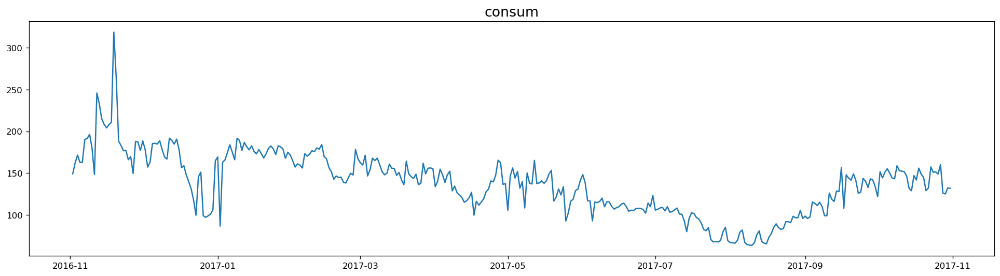

In [316]:
# Time Series Decomposition
result_mul = seasonal_decompose(resamp['consumption_1'], model='multiplicative', extrapolate_trend='freq')

# Deseasonalize
deseasonalized = resamp.consumption_1.values / result_mul.seasonal

# Plot
plt.plot(deseasonalized)
plt.title('consum', fontsize=16)
plt.plot()

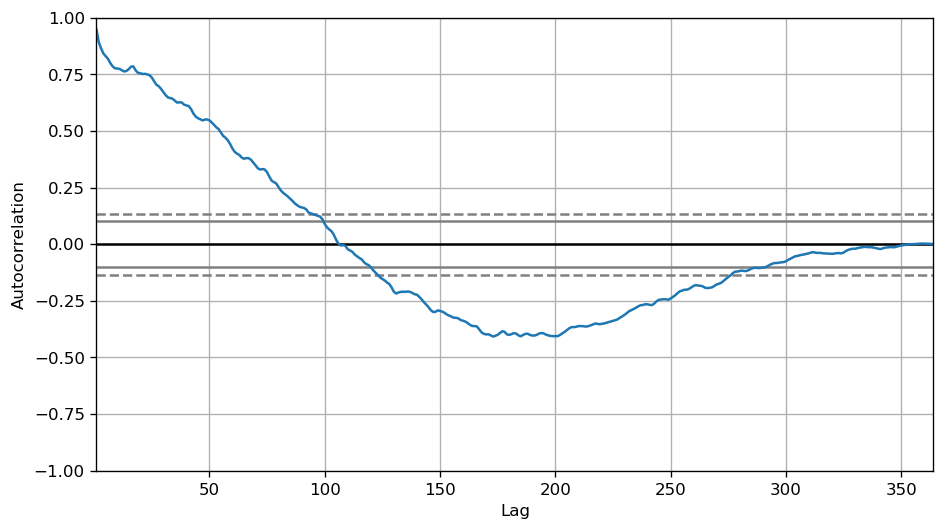

In [318]:
#voir la sesonalite

# Draw Plot
from pandas.plotting import autocorrelation_plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(resamp.temp_1.tolist())

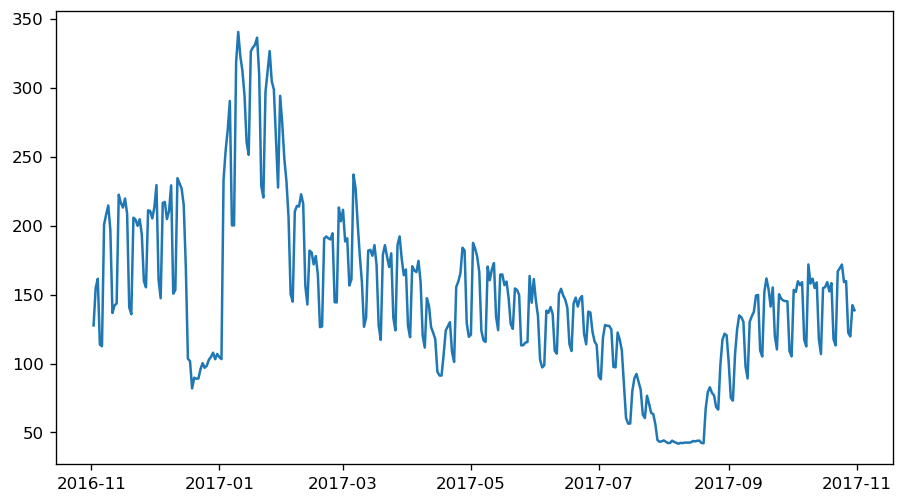

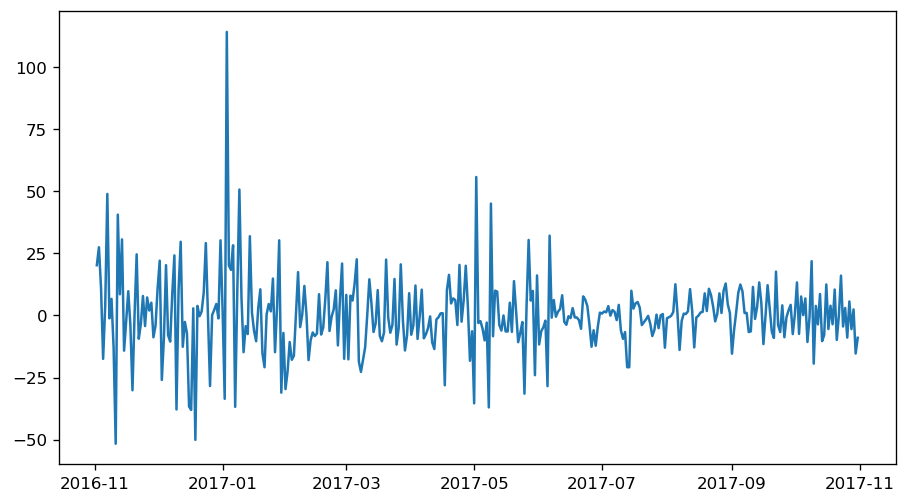

In [320]:
check_plots(resamp['consumption_2'])
check_plots(resamp['consumption_2_diff'])


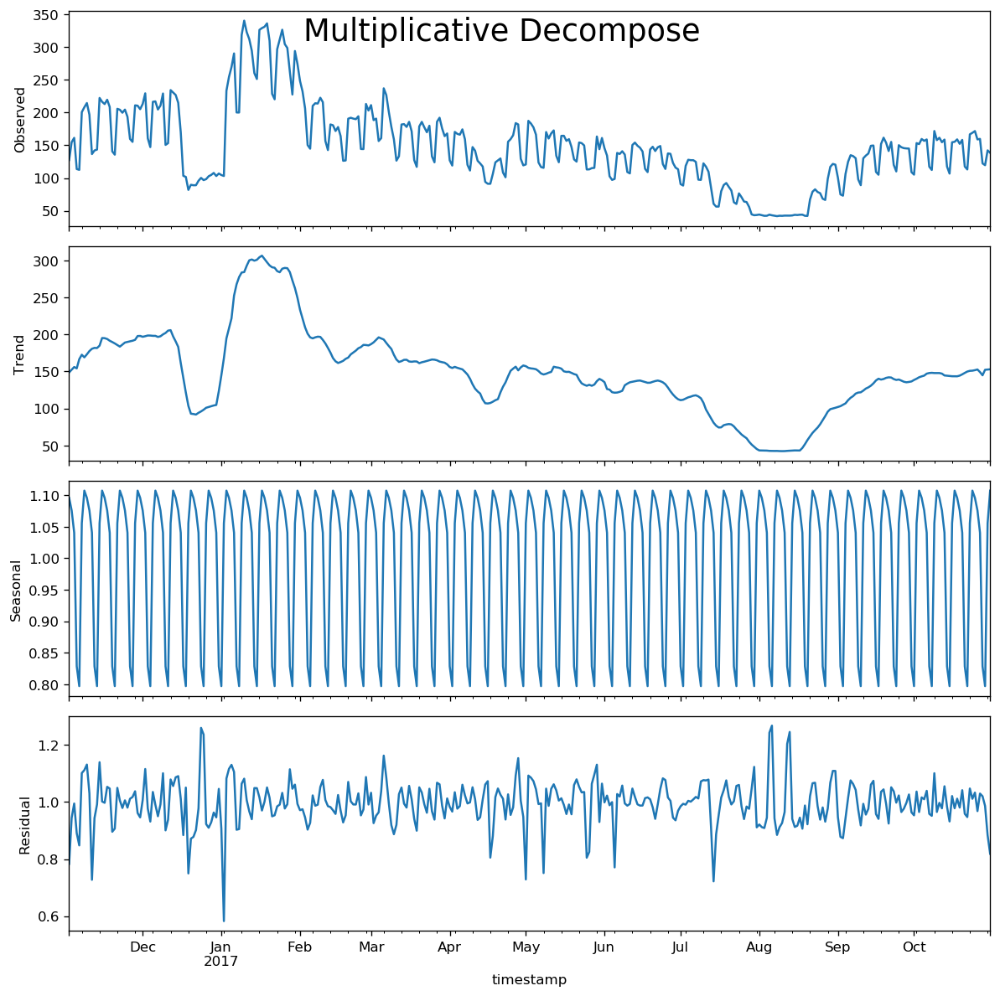

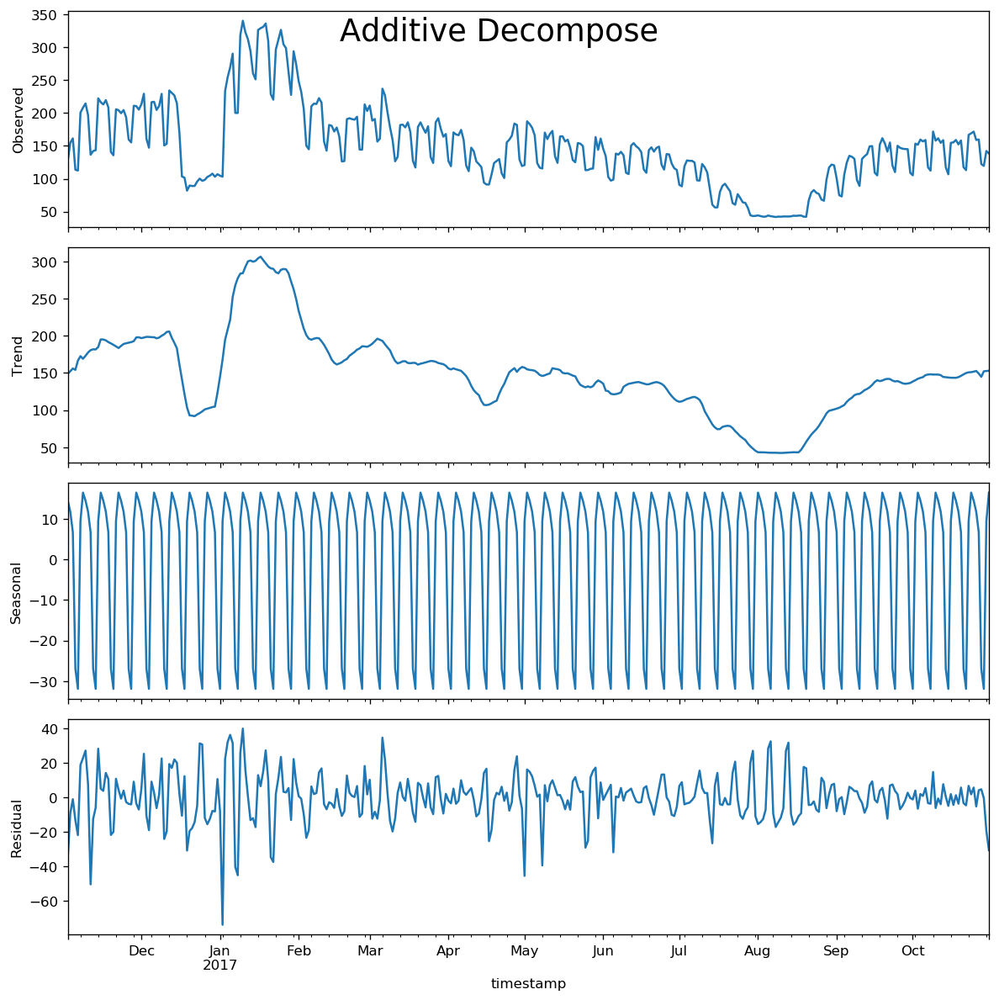

,seas,trend,resid,actual_values
timestamp,,,,
2016-11-02,1.095817,148.677296,0.783090,127.583333
2016-11-03,1.075791,152.311012,0.944688,154.791667
2016-11-04,1.040388,155.944728,0.994907,161.416667
2016-11-05,0.828386,154.125000,0.890934,113.750000
2016-11-06,0.796848,166.553571,0.847977,112.541667


In [321]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

# Multiplicative Decomposition 
result_mul = seasonal_decompose(resamp['consumption_2'], model='multiplicative', extrapolate_trend='freq')

# Additive Decomposition
result_add = seasonal_decompose(resamp['consumption_2'], model='additive', extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

# Extract the Components ----
# Actual Values = Product of (Seasonal * Trend * Resid)
df_reconstructed = pd.concat([result_mul.seasonal, result_mul.trend, result_mul.resid, result_mul.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
df_reconstructed.head()

Une autre méthode consiste à diviser la série en deux parties contiguës ou plus et à calculer les statistiques sommaires comme la moyenne, la variance et l'autocorrélation. Si les statistiques sont tout à fait différentes, alors la série n'est pas stationnaire.

In [322]:
check_summary(resamp['consumption_2'])
check_summary(resamp['consumption_2_diff'])

mean overall = 148.647711, 	 mean1=182.313426, 	 mean2=114.981996
variance overall= 3781.331843, 	 variance1=3709.106321, 	 variance2=1586.796675
mean overall = 0.081669, 	 mean1=0.406889, 	 mean2=-0.243552
variance overall= 232.001262, 	 variance1=367.056916, 	 variance2=96.734070


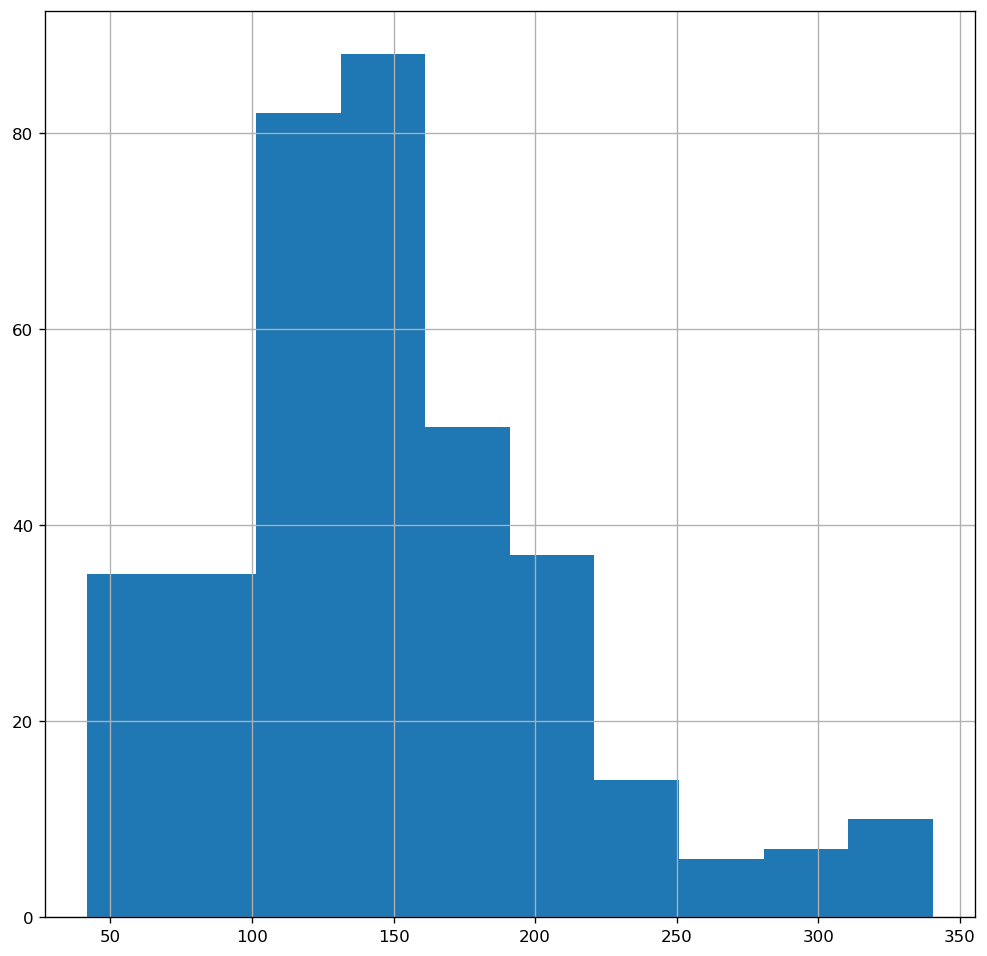

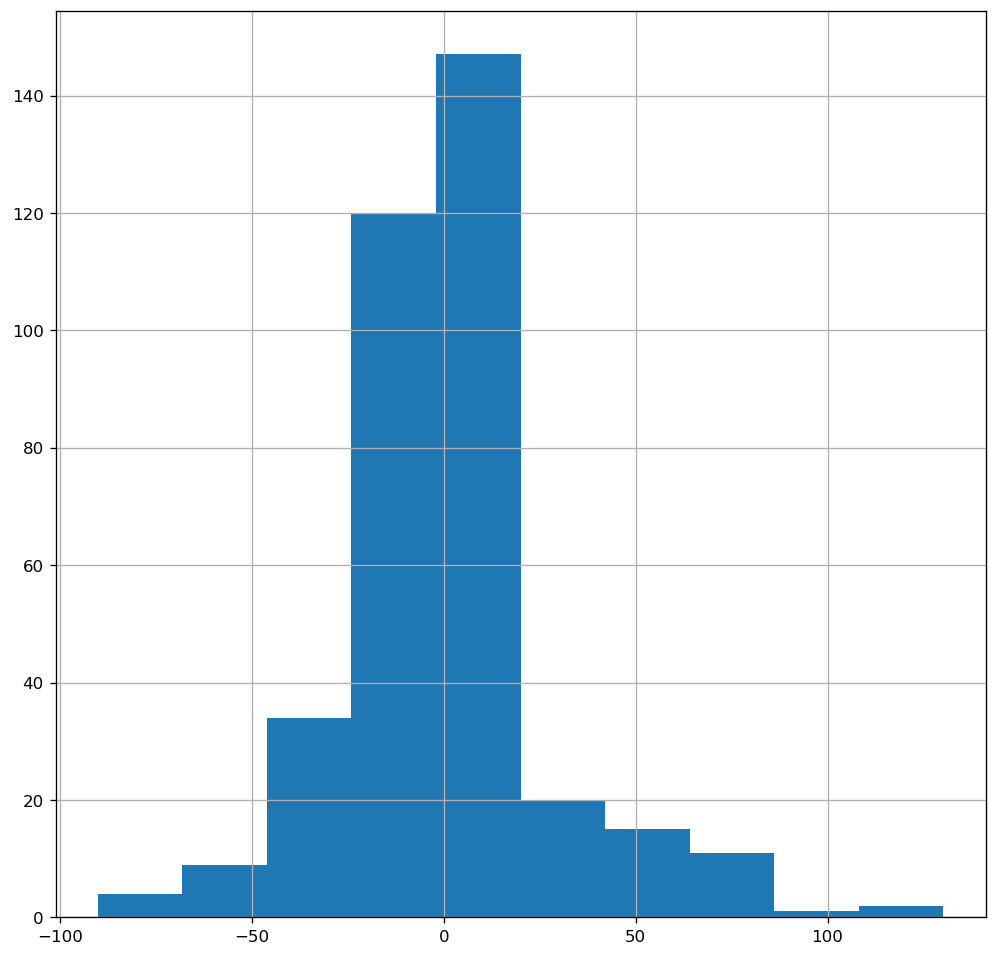

In [323]:
check_distribution(resamp['consumption_2'])
check_distribution(resamp['consumption_2'].diff(1).dropna())

In [324]:
check_stationarity(resamp['consumption_2'])

Test: Running ADF Stationarity test for consumption_2 
	 ADF test statistic: -2.529591602338347 
	 p-value: 0.10843936106686275 

	Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571
	 Conclusion: Series is non-stationary



'Series is non-Stationary'

In [325]:
check_stationarity(resamp['consumption_2_diff'])

Test: Running ADF Stationarity test for consumption_2_diff 
	 ADF test statistic: -11.046523523187176 
	 p-value: 5.2064799211123043e-20 

	Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571
	 Conclusion: Series is stationary at 95% CI



'Series is Stationary @95% CI'

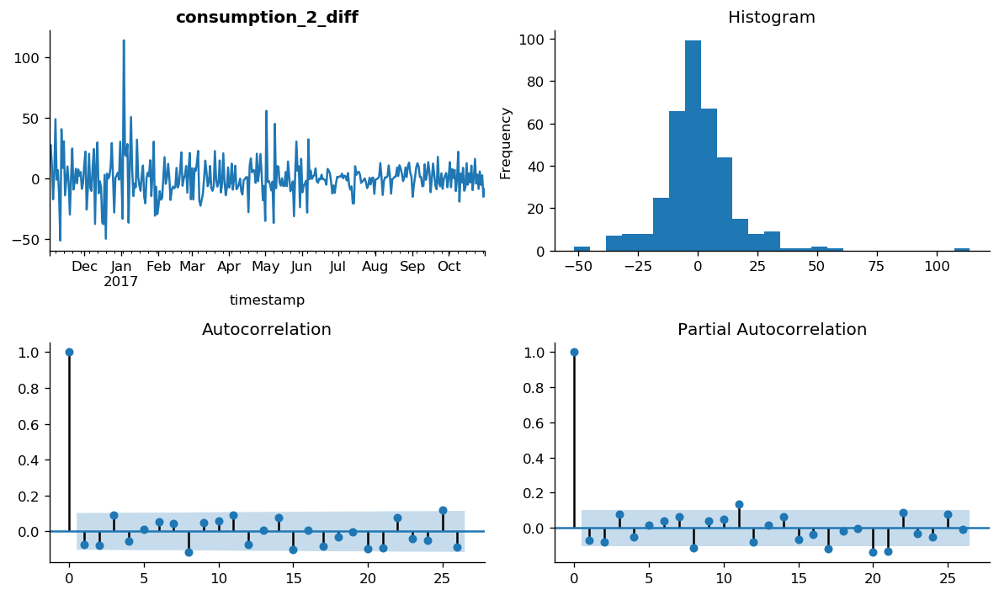

ValueError: operands could not be broadcast together with shapes (364,) (366,) 

In [326]:
tsplot(resamp['consumption_2_diff'], title='consumption_2_diff')
decomposition  =sm.tsa.seasonal_decompose(resamp['consumption_2_diff'], freq=365, model = 'additive')
fig= decomposition.plot()
matplotlib.rcParams['consumption_2_diff'] = [20, 5.0]
cons = resamp['consumption_2_diff']
cons.rolling(1).mean().plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Year', fontsize=20)

In [327]:


grangercausalitytests(data1[['consumption_2', 'mean_national_temp']], maxlag=2)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=148.8791, p=0.0000  , df_denom=8756, df_num=1
ssr based chi2 test:   chi2=148.9301, p=0.0000  , df=1
likelihood ratio test: chi2=147.6782, p=0.0000  , df=1
parameter F test:         F=148.8791, p=0.0000  , df_denom=8756, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=135.1026, p=0.0000  , df_denom=8753, df_num=2
ssr based chi2 test:   chi2=270.3596, p=0.0000  , df=2
likelihood ratio test: chi2=266.2705, p=0.0000  , df=2
parameter F test:         F=135.1026, p=0.0000  , df_denom=8753, df_num=2


{1: ({'ssr_ftest': (148.8791384184882, 5.746143090580672e-34, 8756.0, 1),
   'ssr_chi2test': (148.93014771671292, 2.970362050073117e-34, 1),
   'lrtest': (147.6781822641933, 5.578012012641553e-34, 1),
   'params_ftest': (148.87913841849385, 5.746143090563443e-34, 8756.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (135.1026043866654, 1.633450202135428e-58, 8753.0, 2),
   'ssr_chi2test': (270.3595588297534, 1.9596013736599224e-59, 2),
   'lrtest': (266.2704974391527, 1.5138963234114185e-58, 2),
   'params_ftest': (135.1026043866458, 1.6334502021656972e-58, 8753.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

In [89]:
temp_data = pd.DataFrame(resamp).dropna()
model_data = temp_data[['temp_1', 'temp_2', 'mean_national_temp', 'humidity_1', 'humidity_2',
       'consumption_secondary_1', 'consumption_secondary_2',
       'consumption_secondary_3']]

Exogenous Variables for the model with Lag: 1 
 ['const', 'L1.temp_1', 'L1.temp_2', 'L1.mean_national_temp', 'L1.humidity_1', 'L1.humidity_2', 'L1.consumption_secondary_1', 'L1.consumption_secondary_2', 'L1.consumption_secondary_3']
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 14, Jul, 2019
Time:                     10:26:09
--------------------------------------------------------------------
No. of Equations:         8.00000    BIC:                    28.4173
Nobs:                     363.000    HQIC:                   27.9519
Log likelihood:          -9066.13    FPE:                1.01398e+12
AIC:                      27.6448    Det(Omega_mle):     8.33562e+11
--------------------------------------------------------------------
Results for equation temp_1
                                coefficient       std. error           t-stat            prob
--------------------------------------------------------

************* Running Stationarity and Normality for the Residuals *************

Test: Running Agostino and Pearson Normality test for Residuals_temp_1 
	 Normality test statistic: 0.22292294123520348 
	 p-value: 0.8945258562680899 
	 Conclusion: Residuals_temp_1 is normally distributed at 95% CI 

Test: Running ADF Stationarity test for Residuals_temp_1 
	 ADF test statistic: -10.573327052630507 
	 p-value: 7.210808224910958e-19 

	Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571
	 Conclusion: Series is stationary at 95% CI



NameError: name 'acf' is not defined

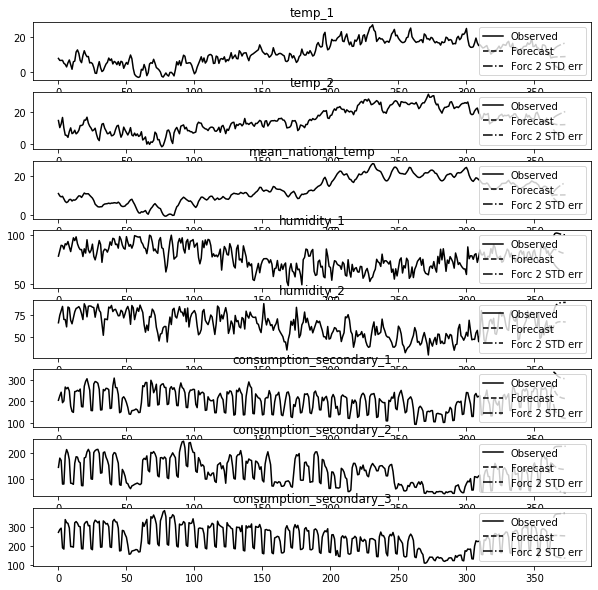

In [90]:
from statsmodels.tsa.api import VAR, DynamicVAR
from scipy import stats
def make_var_model(data, lags = 1, actual_plot = False ):
 
    # make a VAR model
    model = VAR(data)
    
    result_dict = {}

        
    for lag in range(1, lags+1):
        #Fitting Model
        results = model.fit(maxlags = lag)
        
        lag_order = results.k_ar
        
        print ('Exogenous Variables for the model with Lag: %d \n '%lag+ str(results.exog_names))
        print (results.summary())
        
        #Generating Model output
        fitted_values = results.fittedvalues
        forecast_values = pd.DataFrame(data = results.forecast(y= data.values[-lag_order:], steps=  5), columns = results.names)
        results.forecast_interval(y= data.values[-lag_order:], steps = 10)
        
        results.plot_forecast(steps = 10, plot_stderr = True)
        
        if actual_plot ==True:
            results.plot()

        #Storing Residuals for testing purpose
        residuals = results.resid.add_prefix('Residuals_')
        normality_var = {}
        stationarity_var = {}
        acf_data = {}
        
        print("************* Running Stationarity and Normality for the Residuals *************\n")  
        for column in residuals.columns:
            #test for normality of residuals
            normality_var[column] = check_normality(residuals[column])
            #test for stationarity of residuals
            stationarity_var[column] = check_stationarity(residuals[column])
            #acf plots of residuals of each variable for 10 lags
            acf_data[column] = acf(residuals[column])[0:10]       
        
         
        
        result_dict['Lag_Order_{}'.format(lag_order)] = equation_model_data
                   
    return result_dict

#make_var_model(data = mdata1, lags = 1, actual_plot = False )
    
Results = make_var_model(data = model_data, lags = 2, actual_plot = False )

In [91]:
# Creating the VAR model
from statsmodels.tsa.vector_ar.var_model import VAR

model = VAR(dataDiff)

NameError: name 'dataDiff' is not defined

In [92]:
# Best model order
modsel = model.select_order(15)
modsel.summary()

NameError: name 'model' is not defined

In [93]:
# Automated model order selection
results = model.fit(maxlags=15, ic='aic')
results.summary()

NameError: name 'model' is not defined

In [86]:
check_stationarity(resamp['mean_national_temp_diff'])

Test: Running ADF Stationarity test for mean_national_temp_diff 
	 ADF test statistic: -7.382987340950096 
	 p-value: 8.3773836140493e-11 

	Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571
	 Conclusion: Series is stationary at 95% CI



'Series is Stationary @95% CI'

In [87]:
adf_test(resamp['mean_national_temp_diff'])
kpss_test(resamp['mean_national_temp_diff'])

Results of Dickey-Fuller Test:
Test Statistic                -7.382987e+00
p-value                        8.377384e-11
#Lags Used                     1.100000e+01
Number of Observations Used    3.520000e+02
Critical Value (1%)           -3.449065e+00
Critical Value (5%)           -2.869786e+00
Critical Value (10%)          -2.571163e+00
dtype: float64
Results of KPSS Test:
Test Statistic            0.18985
p-value                   0.10000
Lags Used                17.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64


/home/anthelix/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning:

p-value is greater than the indicated p-value



In [133]:
grangres = results.test_causality('consumption_1', ['temp_1', 'mean_national_temp', 'humidity_1'], kind='f')
grangres.summary

NameError: name 'results' is not defined